# 3. ML-ENSO - TRAINING

In [1]:
print("hello world")

hello world


In [2]:
# IPython extension to reload modules before executing user code.
%load_ext autoreload
%autoreload 2

### Imports

In [3]:
import utils

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import FormatStrFormatter
import os
import pandas as pd
import xarray as xr
import calendar
import pickle

from datetime import datetime

import sklearn
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
import scipy.stats

from tqdm import tqdm


import utilities.graph_utils as graph_utils
import itertools  
import time

from sklearn.model_selection import TimeSeriesSplit 

### Define folders

In [5]:
# CMIP6_ANOM_1M_1X1D_FOLDER = 'datasets/CMIP6/CMIP6_regridded/anom_1m'
# CMIP6_ONI_FOLDER = 'datasets/CMIP6/CMIP6_regridded/oni'
# CMIP6_NINO34_FOLDER = 'datasets/CMIP6/CMIP6_regridded/nino34'

# HadISST_ANOM_1M_1X1D_FOLDER = 'datasets/HadISST/HadISST_regridded/anom_1m'
# HadISST_ONI_FOLDER = 'datasets/HadISST/HadISST_regridded/oni'
# HadISST_NINO34_FOLDER = 'datasets/HadISST/HadISST_regridded/nino34'

# MODELS_ONI_FOLDER = 'saved_models/oni'
# MODELS_NINO34_FOLDER = 'saved_models/nino34'

RESULTS_ONI_FOLDER = 'saved_results/oni'

RESULTS_NINO34_FOLDER = 'saved_results/nino34'


RESULTS_EC_FOLDER = 'saved_results/ec'



target_to_results_folder = {
    "oni": RESULTS_ONI_FOLDER,
    "nino34": RESULTS_NINO34_FOLDER,
    "E": RESULTS_EC_FOLDER,
    "C": RESULTS_EC_FOLDER
}
target_to_results_folder

{'oni': 'saved_results/oni',
 'nino34': 'saved_results/nino34',
 'E': 'saved_results/ec',
 'C': 'saved_results/ec'}

### Global variables

#### General settings

In [6]:
TARGETS = ["E", "C"] # or ["E", "C", "oni", "nino34"]
TARGETS_STR = ''.join(TARGETS)
INPUT_TIME_STEPS = 3
# START_LEAD_TIME = 0
MAX_LEAD_TIME = 25
# LEAD_TIME_STEP = 1

# represent all lon*lat predictors with far fewer dimensions
USE_PCA = False
PCA_COMPONENTS = 32

SAVE_PLOTS_TO_DISK = True

In [7]:
IMG_FOLDER = f'img/pf_lr_rr_Target_{TARGETS_STR}/'

if SAVE_PLOTS_TO_DISK == True:
    os.makedirs(IMG_FOLDER, exist_ok=True) 
    
IMG_FOLDER

'img/pf_lr_rr_Target_EC/'

In [8]:
# target = TARGETS[0]

#### Select training region

In [9]:
RESOLUTION = 5 # 1, 4 or 5 (in degrees)
FULL_MAP = False

if FULL_MAP == True:
    # Full map
    MIN_LAT, MAX_LAT = -90, +90
    MIN_LON, MAX_LON = 0, 360
    LAT_SLICE = None
    LON_SLICE = None
else:
    # Ham et. al: 0°–360°E, 55°S–60°N for three consecutive months 
    MIN_LAT, MAX_LAT = -55, 60
    MIN_LON, MAX_LON = 0, 360

    # MIN_LAT, MAX_LAT = -5, 5
    # MIN_LON, MAX_LON = 190, 240

    
    LAT_SLICE = slice(MIN_LAT, MAX_LAT)
    LON_SLICE = slice(MIN_LON, MAX_LON) 

    # Tello et. al: 0°–360°E, 75°S–65°N for three consecutive months 
    # MIN_LAT, MAX_LAT = -75, 65
    # MIN_LON, MAX_LON = 0, 360
    
    # LAT_SLICE = slice(MIN_LAT, MAX_LAT)
    # LON_SLICE = slice(MIN_LON, MAX_LON) 


# Niño 3.4 (5N-5S, 170W-120W)
# nino34_min_lat, nino34_max_lat = -5, 5
# nino34_min_lon, nino34_max_lon = 190, 240


In [10]:
COORDINATES = utils.add_cardinals_title(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)
COORDINATES

'55S-60N, 180W-180E'

#### Select dataset source 

In [11]:
# TRAIN_SOURCE_IDS = ["MRI-ESM2-0", "MIROC6", "BCC-ESM1", "FGOALS-f3-L", "GISS-E2-1-G", "HADISST"]
# TRAIN_SOURCE_IDS = ["GISS-E2-1-G"]
TRAIN_SOURCE_IDS = ["HADISST"]

In [12]:
# source_id = TRAIN_SOURCE_IDS[0]

In [13]:
TRAIN_SOURCE_IDS_STR = ', '.join(TRAIN_SOURCE_IDS)
TRAIN_SOURCE_IDS_STR

'HADISST'

In [14]:
TRAIN_SOURCE_IDS_FILENAME = '_'.join([source_id.split("-")[0] for source_id in TRAIN_SOURCE_IDS])
TRAIN_SOURCE_IDS_FILENAME

'HADISST'

In [15]:
# TEST_SOURCE_ID = "GISS-E2-1-G"
# TEST_SOURCE_ID = "HADISST"
TEST_SOURCE_ID = "GODAS"
TEST_SOURCE_ID

'GODAS'

In [16]:
TEST_SOURCE_ID_FILENAME = TEST_SOURCE_ID.split("-")[0]
TEST_SOURCE_ID_FILENAME

'GODAS'

#### Select dates for Train-Val-Test split
Randomly splitting time series data into a train set and a test set is very risky. \
In many climate datasets, time series have a non-neglible auto-correlation (correlation of a time series and its lagged version over time). \
Think of it like this: the atmosphere usually has a "memory" of about 14 days, and the ocean roughly has a "memory" of about 2 years.

_(source: [CCAI Seasonal Forecasting tutorial](https://colab.research.google.com/drive/1eLEYFK3Mrae_nu1SzAjg7Sdf40bWnKTg#scrollTo=XrbMcDoscZM0&forceEdit=true&sandboxMode=true))_

Ham et al split (Extended Data Table 2)
- **Training dataset**:
    - CMIP5 historical run: 1861-2004  
    - Reanalysis (SODA): 1871-1973
- **Validation dataset**:
    - Reanalysis (GODAS): 1984-2017

In [17]:
# train_start_date = '1851-01-01'
# train_start_date = '1871-01-01'
# train_end_date = '1970-12-31'

# val_start_date = '1976-01-01'
# val_end_date =   '1990-12-31'

# these "Old dates are used to evaluate the pre-tuned model
# on the CMIP and HadISST datasets that only go up to 2015
# test_start_date_OLD = '1996-01-01'
# test_end_date_OLD =   '2010-12-31'




# Following Ham et al split (Extended Data Table 2),
# and splitting the training dataset into train and val
# We include a 10 year gap betwen each set #

# train set: 83 years
train_start_date = '1871-01-01'
train_end_date = '1953-12-31'

# val set: 10 years
val_start_date = '1964-01-01'
val_end_date =   '1973-12-31'

# val set: 34 years
test_start_date = '1984-01-01'
test_end_date =   '2017-12-31'

print(f"Train start and end dates: {train_start_date} to {train_end_date}")
print(f"Val start and end dates: {val_start_date} to {val_end_date}")
print(f"Test start and end dates: {test_start_date} to {test_end_date}")

Train start and end dates: 1871-01-01 to 1953-12-31
Val start and end dates: 1964-01-01 to 1973-12-31
Test start and end dates: 1984-01-01 to 2017-12-31


In [18]:
train_years, train_months, train_days = graph_utils.compute_time_interval(train_start_date, train_end_date)
val_years, val_months, val_days = graph_utils.compute_time_interval(val_start_date, val_end_date)
test_years, test_months, test_days = graph_utils.compute_time_interval(test_start_date, test_end_date)
total_years = train_years + val_years + test_years
print(f"Total years (not including gaps between datsets): {train_years + val_years + test_years}")

print(f"The training period is   {train_years:>2} years, {train_months:>2} months, and {train_days:>2} days long ({train_years/total_years:.1%})")
print(f"The validation period is {val_years:>2} years, {val_months:>2} months, and {val_days:>2} days long ({val_years/total_years:.1%})")
print(f"The testing period is    {test_years:>2} years, {test_months:>2} months, and {test_days:>2} days long ({test_years/total_years:.1%})")
print()

years, months, days = graph_utils.compute_time_interval(train_end_date, val_start_date)
print(f"The interval between the training set and the validation set is:    {years:>2} years, {months:>2} months, and {days:>2} days long")

years, months, days = graph_utils.compute_time_interval(val_end_date, test_start_date)
print(f"The interval between the training set and the validation set is:    {years:>2} years, {months:>2} months, and {days:>2} days long")

Total years (not including gaps between datsets): 127
The training period is   83 years,  0 months, and  0 days long (65.4%)
The validation period is 10 years,  0 months, and  0 days long (7.9%)
The testing period is    34 years,  0 months, and  0 days long (26.8%)

The interval between the training set and the validation set is:    10 years,  0 months, and  0 days long
The interval between the training set and the validation set is:    10 years,  0 months, and  0 days long


In [19]:
# # train_start_date = '1851-01-01'
# train_start_date = '1871-01-01'
# train_end_date = '1970-12-31'

# val_start_date = '1976-01-01'
# val_end_date =   '1990-12-31'

# # test_start_date = '1996-01-01'
# # test_end_date =   '2010-12-31'

# # GODAS test dates as in Graphino
# test_start_date = '1984-01-01'
# test_end_date =   '2017-12-31'

# print(f"Train start and end dates: {train_start_date} to {train_end_date}")
# print(f"Val start and end dates: {val_start_date} to {val_end_date}")
# print(f"Test start and end dates: {test_start_date} to {test_end_date}")

In [20]:
# extract year part of the dates
train_start_year = train_start_date.split("-")[0]
train_end_year   = train_end_date.split("-")[0]

val_start_year = val_start_date.split("-")[0]
val_end_year   = val_end_date.split("-")[0]

test_start_year = test_start_date.split("-")[0]
test_end_year   = test_end_date.split("-")[0]

print(f"Train start and end years: {train_start_year}-{train_end_year}")
print(f"Val   start and end years: {val_start_year}-{val_end_year}")
print(f"Test  start and end years: {test_start_year}-{test_end_year}")

Train start and end years: 1871-1953
Val   start and end years: 1964-1973
Test  start and end years: 1984-2017


## Training

### Assemble predictors / predictands example
This section was inspired by CCAI AI for Climate science - Forecasting the El Niño with Machine Learning

In [21]:
TRAIN_SOURCE_IDS
TEST_SOURCE_ID

'GODAS'

In [22]:
TRAIN_SOURCE_IDS

['HADISST']

#### Train data assembly example

In [23]:
# example
X_train_example, y_train_example = graph_utils.assemble_graph_predictors_predictands(TRAIN_SOURCE_IDS[0], RESOLUTION, TARGETS[0], train_start_date, train_end_date, 
                                                                     lead_time=1, num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE,  
                                                                     data_format="flatten", use_pca=USE_PCA, pca_components=PCA_COMPONENTS, fill_nan=True, remove_win=False, verbose=True)

X_train_example.shape, y_train_example.shape


Predictors:
• Search for `HADISST` SST file in datasets/HadISST/HadISST_regridded/anom_1m_5x5deg
• Load OBS.HAD.HADISST.regridded_tos_anom_1m_5x5deg.nc (1870-01-16 to 2024-02-15)
• Slice the time period from 1871-01-01 to 1953-12-31
• Nb of original samples (nb months): 996
• Nb of output samples, each containing 3 time steps: 994
• Reshape sst anomalies into a 2D (994, 4968) array: 994 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 1,019,850 nan values (continents) out of 4,938,192 with 0's (20.65%)
• The dimensions are: (994, 4968): 994 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `HADISST` target file in datasets/HadISST/HadISST_regridded/ec_indices
• Load OBS.HAD.HADISST.pca_ec_indices.txt (1870-01-16 to 2023-12-16)
• Slice the time period with 01 month(s) lead time and 2 months offset: from 1871-04-01 to 1954-01-31
• The dimensions are: (994,): 994 months, 1 target value per month



((994, 4968), (994,))

In [24]:
# example
X_train_example_spatial, y_train_example_spatial = graph_utils.assemble_graph_predictors_predictands(TRAIN_SOURCE_IDS[0], RESOLUTION, TARGETS[0], train_start_date, train_end_date, 
                                                                     lead_time=1, num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE,  
                                                                     data_format="spatial", fill_nan=True, remove_win=False, verbose=True)

X_train_example_spatial.shape, X_train_example_spatial.shape


Predictors:
• Search for `HADISST` SST file in datasets/HadISST/HadISST_regridded/anom_1m_5x5deg
• Load OBS.HAD.HADISST.regridded_tos_anom_1m_5x5deg.nc (1870-01-16 to 2024-02-15)
• Slice the time period from 1871-01-01 to 1953-12-31
• Nb of original samples (nb months): 996
• Nb of output samples, each containing 3 time steps: 994
• sst anomalies are a 4D (994, 3, 23, 72) array: 994 months x 3 num_input_time_steps, 23 lat, 72 lon values per month
• Replace 1,019,850 nan values (continents) out of 4,938,192 with 0's (20.65%)
• The dimensions are: (994, 3, 23, 72): 994 months x 3 num_input_time_steps, 23 lat, 72 lon values per month

Predictands:
• Search for `HADISST` target file in datasets/HadISST/HadISST_regridded/ec_indices
• Load OBS.HAD.HADISST.pca_ec_indices.txt (1870-01-16 to 2023-12-16)
• Slice the time period with 01 month(s) lead time and 2 months offset: from 1871-04-01 to 1954-01-31
• The dimensions are: (994,): 994 months, 1 target value per month



((994, 3, 23, 72), (994, 3, 23, 72))

In [25]:
nb_lon_gridpoints = X_train_example_spatial.shape[-1]
nb_lat_gridpoints = X_train_example_spatial.shape[-2]
nb_lon_gridpoints, nb_lat_gridpoints

(72, 23)

#### Test data assembly example

In [26]:
# example
X_test_example, y_test_example = graph_utils.assemble_graph_predictors_predictands(TEST_SOURCE_ID, RESOLUTION, TARGETS[0], test_start_date, test_end_date, 
                                                                     lead_time=1, num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE,  
                                                                     data_format="flatten", use_pca=USE_PCA, pca_components=PCA_COMPONENTS, fill_nan=True, remove_win=False, verbose=True)

X_test_example.shape, X_test_example.shape


Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 01 month(s) lead time and 2 months offset: from 1984-04-01 to 2018-01-31
• The dimensions are: (406,): 406 months, 1 target value per month



((406, 4968), (406, 4968))

### Get continents indices

In [27]:
ALL_SOURCE_IDS = ["MRI-ESM2-0", "MIROC6", "BCC-ESM1", "FGOALS-f3-L", "GISS-E2-1-G", "HADISST"]

# Step 1: Initialize lists to collect data from multiple sources
X_train_list, y_train_list = [], []

# Iterate over each source_id and assemble the data
for source_id in ALL_SOURCE_IDS:
    print(f"\nAssemble predictors and predictands from source_id: {source_id}")
    X_train, y_train = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, TARGETS[0], train_start_date, train_end_date, 
                                                             lead_time=1, num_input_time_steps=INPUT_TIME_STEPS, 
                                                             lat_slice=LAT_SLICE, lon_slice=LON_SLICE, 
                                                             data_format="spatial", verbose=False)

    X_train_list.append(X_train)
    y_train_list.append(y_train)

# Concatenate data from all sources
X_train_all_source_ids = xr.concat(X_train_list, dim='time')
y_train_all_source_ids = pd.concat(y_train_list)

print(f"\nConcatenate data from all sources:")
print(f"• X_train_all_source_ids.shape: {X_train_all_source_ids.shape}, y_train_all_source_ids.shape: {y_train_all_source_ids.shape}")



Assemble predictors and predictands from source_id: MRI-ESM2-0

Assemble predictors and predictands from source_id: MIROC6

Assemble predictors and predictands from source_id: BCC-ESM1

Assemble predictors and predictands from source_id: FGOALS-f3-L

Assemble predictors and predictands from source_id: GISS-E2-1-G

Assemble predictors and predictands from source_id: HADISST

Concatenate data from all sources:
• X_train_all_source_ids.shape: (5964, 3, 23, 72), y_train_all_source_ids.shape: (5964,)


#### Identify invalid / continents points

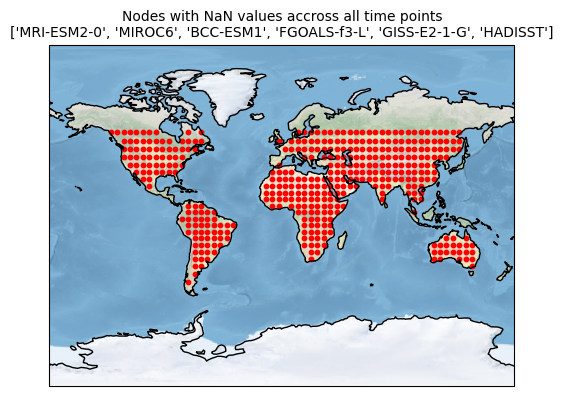

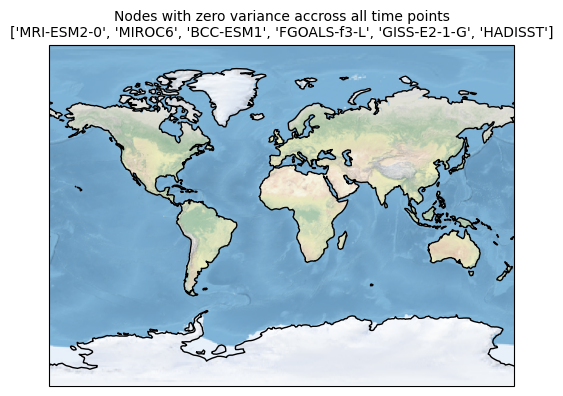

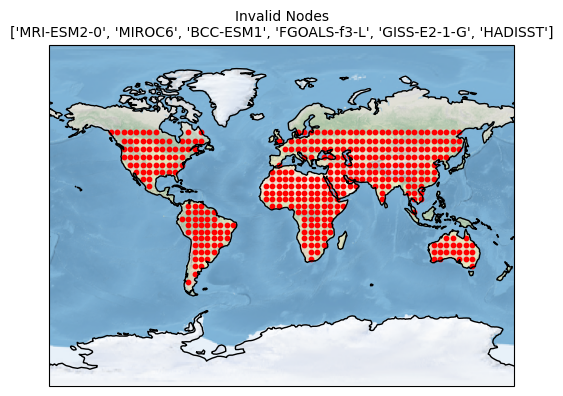

In [28]:
# Identify and plot invalid (NaN and Zero variance) points
nan_lonlat_indices, nan_lonlat_coords = graph_utils.get_nan_points(X_train_all_source_ids)
zero_var_lon_lat_indices, zero_var_lonlat_coords = graph_utils.get_zero_variance_points(X_train_all_source_ids)
invalid_lonlat_indices = np.concatenate((nan_lonlat_indices, zero_var_lon_lat_indices))
invalid_lonlat_coords = np.concatenate((nan_lonlat_coords, zero_var_lonlat_coords))

# Returns the indices that would sort an array
index_array = np.argsort(invalid_lonlat_indices)

# Sort merged NaN and Zero variance indices and coords
sorted_invalid_lonlat_indices = invalid_lonlat_indices[index_array]
sorted_invalid_lonlat_coords = invalid_lonlat_coords[index_array]


# # Plot nodes with NaN values
title = f"Nodes with NaN values accross all time points\n{ALL_SOURCE_IDS}"
graph_utils.plot_coords(nan_lonlat_coords, figsize=(6, 6), title=title)

# # Plot nodes with zero variance
title = f"Nodes with zero variance accross all time points\n{ALL_SOURCE_IDS}"
graph_utils.plot_coords(zero_var_lonlat_coords, figsize=(6, 6), title=title)

# Plot all invalid nodes (NaN values and zero variance)
title = f"Invalid Nodes\n{ALL_SOURCE_IDS}"
graph_utils.plot_coords(sorted_invalid_lonlat_coords, figsize=(6, 6), title=title)


#### Identify nan points for GODAS test set accross all years

In [29]:
X_test, y_test = graph_utils.assemble_graph_predictors_predictands(TEST_SOURCE_ID, RESOLUTION, TARGETS[0], test_start_date, test_end_date, 
                                                         lead_time=1, num_input_time_steps=INPUT_TIME_STEPS, 
                                                         lat_slice=LAT_SLICE, lon_slice=LON_SLICE, 
                                                         data_format="spatial", verbose=False)

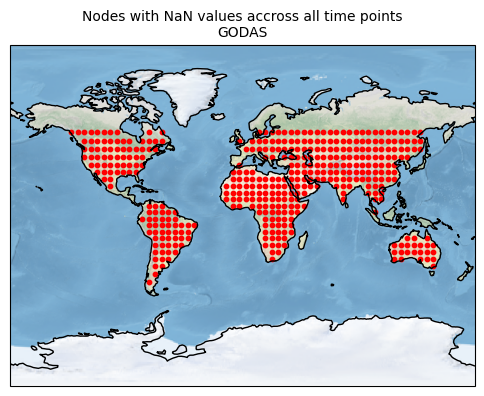

In [30]:
# Identify and plot invalid (NaN and Zero variance) points
godas_nan_lonlat_indices, godas_nan_lonlat_coords = graph_utils.get_nan_points(X_test)

# Returns the indices that would sort an array
godas_index_array = np.argsort(godas_nan_lonlat_indices)

# Sort merged NaN and Zero variance indices and coords
godas_sorted_invalid_lonlat_indices = godas_nan_lonlat_indices[godas_index_array]
godas_sorted_invalid_lonlat_coords = godas_nan_lonlat_coords[godas_index_array]


# # Plot nodes with NaN values
title = f"Nodes with NaN values accross all time points\n{TEST_SOURCE_ID}"
graph_utils.plot_coords(nan_lonlat_coords, figsize=(6, 6), title=title)


### Linear Regression

#### Train Linear regression models across different lead times

Train linear regression models across different lead times and evaluate their performance in predicting ONI indices 

In [31]:
TEST_SOURCE_ID

'GODAS'

In [32]:
start_time_training = time.time()
start_time_training_datetime = datetime.fromtimestamp(start_time_training)
print("Start training time: ", start_time_training_datetime.strftime('%Y-%m-%d %H:%M:%S'))

Start training time:  2024-08-16 00:35:43


In [33]:
# Sample loading of train, val, and test sets
verbose = True

print(f"Linear regressor trained on {TRAIN_SOURCE_IDS_STR} data ({utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}) from {train_start_date} to {train_end_date}")
lr_results = {}
for target in TARGETS:
    print(f"======================================================================================================")
    print(f"Target = {target}")

    lr_results[target] = []
    for lead_time in range(0, MAX_LEAD_TIME, 1):
        print(f"------------------------------------------------------------------------------------------------------")
        print(f"Lead Time: {lead_time}")
    
        lr_experiment_name = (
            f"LR_"
            f"Train_{TRAIN_SOURCE_IDS_FILENAME}_"
            f"{train_start_year}-{train_end_year}_"
            f"Test_{TEST_SOURCE_ID_FILENAME}_"
            f"{test_start_year}-{test_end_year}_"
            f"Win{INPUT_TIME_STEPS:02d}_"
            f"{utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}_"
            f"Res{RESOLUTION}_"
            f"{target.capitalize()}Idx_"
            f"Lead{lead_time:02d}"
        )
    
        # TRAIN data
        # Step 1: Assemble graph predictors predictands from multiple sources
        X_train_list, y_train_list = [], []
        
        for source_id in TRAIN_SOURCE_IDS:
            print(f"Assemble Train predictors and predictands from source_id: {source_id}")
            
           # Assemble training and validation datasets for the specified lead time
            X_train, y_train = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, target, train_start_date, train_end_date, 
                                                                                 lead_time=lead_time, num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE,  
                                                                                 data_format="flatten", use_pca=USE_PCA, pca_components=PCA_COMPONENTS, fill_nan=True, remove_win=False, verbose=verbose)
            X_train_list.append(X_train)
            y_train_list.append(y_train)
        
        # Concatenate train data from all sources
        X_train = np.concatenate(X_train_list, axis=0)
        y_train = pd.concat(y_train_list)

        
        # print(f"\nConcatenate train data from all sources:")
        print(f"• X_train.shape: {X_train.shape}, y_train.shape: {y_train.shape}")    
        
        print(f"\nTrain Linear Regression model:")
        # Train a Linear regression model using the training data
        regr = sklearn.linear_model.LinearRegression(n_jobs=-1)
        display(regr)
        regr.fit(X_train, y_train)
    
        # Evaluate the model on the test data
        print(f"Assemble Test predictors and predictands from source_id: {TEST_SOURCE_ID}")
        X_test, y_test = graph_utils.assemble_graph_predictors_predictands(TEST_SOURCE_ID, RESOLUTION, target, test_start_date, test_end_date, 
                                                                           lead_time=lead_time, num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE,  
                                                                           data_format="flatten", use_pca=USE_PCA, pca_components=PCA_COMPONENTS, fill_nan=True, remove_win=False, verbose=verbose)
        print(f"• X_test.shape: {X_test.shape}, y_test.shape: {y_test.shape}")
    
        
        predictions = regr.predict(X_test)
        corr, _ = scipy.stats.pearsonr(predictions, y_test)
        mse = mean_squared_error(y_test, predictions)
    
        # Store model performance metrics and coefficients in a dictionary for the current lead time
        lr_dict = { 
            'model_name': 'Linear Regression',
            'experiment_name': lr_experiment_name,
            'train_source_ids': TRAIN_SOURCE_IDS,
            'test_source_id': TEST_SOURCE_ID,
            'nb_train_samples': X_train.shape[0],
            'nb_test_samples': X_test.shape[0],
            'target': target, 
            'train_start_date': train_start_date,
            'train_end_date': train_end_date,
            'val_start_date': None,
            'val_end_date': None,
            'test_start_date': test_start_date,
            'test_end_date': test_end_date,
            'lead_time': lead_time,
            'num_input_time_steps': INPUT_TIME_STEPS,
            'y_test': y_test,
            'predictions': predictions,
            'corr': corr, 
            'mse': mse,
            'weights': regr.coef_,
        }
        lr_results[target].append(lr_dict)
    
        print(f'Predicted and True {target} Indices at {lead_time} Months Lead Time: Corr: {corr:.3f}, MSE: {mse:.3f}')
        # plot_nino_time_series(y_test, predictions, source_id,
        #     f'Predicted and True {target} Indices at {lead_time} Month Lead Time\nCorr: {corr:.2f}, MSE: {mse:.2f}')

Linear regressor trained on HADISST data (55S-60N-180W-180E) from 1871-01-01 to 1953-12-31
Target = E
------------------------------------------------------------------------------------------------------
Lead Time: 0
Assemble Train predictors and predictands from source_id: HADISST

Predictors:
• Search for `HADISST` SST file in datasets/HadISST/HadISST_regridded/anom_1m_5x5deg
• Load OBS.HAD.HADISST.regridded_tos_anom_1m_5x5deg.nc (1870-01-16 to 2024-02-15)
• Slice the time period from 1871-01-01 to 1953-12-31
• Nb of original samples (nb months): 996
• Nb of output samples, each containing 3 time steps: 994
• Reshape sst anomalies into a 2D (994, 4968) array: 994 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 1,019,850 nan values (continents) out of 4,938,192 with 0's (20.65%)
• The dimensions are: (994, 4968): 994 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `HADISST` target file in datasets/HadISST/HadISST_regridded

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 00 month(s) lead time and 2 months offset: from 1984-03-01 to 2017-12-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 01 month(s) lead time and 2 months offset: from 1984-04-01 to 2018-01-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 02 month(s) lead time and 2 months offset: from 1984-05-01 to 2018-02-28
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 03 month(s) lead time and 2 months offset: from 1984-06-01 to 2018-03-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 04 month(s) lead time and 2 months offset: from 1984-07-01 to 2018-04-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 05 month(s) lead time and 2 months offset: from 1984-08-01 to 2018-05-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 06 month(s) lead time and 2 months offset: from 1984-09-01 to 2018-06-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 07 month(s) lead time and 2 months offset: from 1984-10-01 to 2018-07-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 08 month(s) lead time and 2 months offset: from 1984-11-01 to 2018-08-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 09 month(s) lead time and 2 months offset: from 1984-12-01 to 2018-09-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 10 month(s) lead time and 2 months offset: from 1985-01-01 to 2018-10-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 11 month(s) lead time and 2 months offset: from 1985-02-01 to 2018-11-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 12 month(s) lead time and 2 months offset: from 1985-03-01 to 2018-12-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 13 month(s) lead time and 2 months offset: from 1985-04-01 to 2019-01-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 14 month(s) lead time and 2 months offset: from 1985-05-01 to 2019-02-28
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 15 month(s) lead time and 2 months offset: from 1985-06-01 to 2019-03-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 16 month(s) lead time and 2 months offset: from 1985-07-01 to 2019-04-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 17 month(s) lead time and 2 months offset: from 1985-08-01 to 2019-05-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 18 month(s) lead time and 2 months offset: from 1985-09-01 to 2019-06-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 19 month(s) lead time and 2 months offset: from 1985-10-01 to 2019-07-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 20 month(s) lead time and 2 months offset: from 1985-11-01 to 2019-08-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 21 month(s) lead time and 2 months offset: from 1985-12-01 to 2019-09-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 22 month(s) lead time and 2 months offset: from 1986-01-01 to 2019-10-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 23 month(s) lead time and 2 months offset: from 1986-02-01 to 2019-11-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 24 month(s) lead time and 2 months offset: from 1986-03-01 to 2019-12-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 00 month(s) lead time and 2 months offset: from 1984-03-01 to 2017-12-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 01 month(s) lead time and 2 months offset: from 1984-04-01 to 2018-01-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 02 month(s) lead time and 2 months offset: from 1984-05-01 to 2018-02-28
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 03 month(s) lead time and 2 months offset: from 1984-06-01 to 2018-03-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 04 month(s) lead time and 2 months offset: from 1984-07-01 to 2018-04-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 05 month(s) lead time and 2 months offset: from 1984-08-01 to 2018-05-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 06 month(s) lead time and 2 months offset: from 1984-09-01 to 2018-06-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 07 month(s) lead time and 2 months offset: from 1984-10-01 to 2018-07-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 08 month(s) lead time and 2 months offset: from 1984-11-01 to 2018-08-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 09 month(s) lead time and 2 months offset: from 1984-12-01 to 2018-09-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 10 month(s) lead time and 2 months offset: from 1985-01-01 to 2018-10-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 11 month(s) lead time and 2 months offset: from 1985-02-01 to 2018-11-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 12 month(s) lead time and 2 months offset: from 1985-03-01 to 2018-12-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 13 month(s) lead time and 2 months offset: from 1985-04-01 to 2019-01-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 14 month(s) lead time and 2 months offset: from 1985-05-01 to 2019-02-28
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 15 month(s) lead time and 2 months offset: from 1985-06-01 to 2019-03-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 16 month(s) lead time and 2 months offset: from 1985-07-01 to 2019-04-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 17 month(s) lead time and 2 months offset: from 1985-08-01 to 2019-05-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 18 month(s) lead time and 2 months offset: from 1985-09-01 to 2019-06-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 19 month(s) lead time and 2 months offset: from 1985-10-01 to 2019-07-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 20 month(s) lead time and 2 months offset: from 1985-11-01 to 2019-08-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 21 month(s) lead time and 2 months offset: from 1985-12-01 to 2019-09-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 22 month(s) lead time and 2 months offset: from 1986-01-01 to 2019-10-31
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 23 month(s) lead time and 2 months offset: from 1986-02-01 to 2019-11-30
• The dimensions are: (406

LinearRegression(n_jobs=-1)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 24 month(s) lead time and 2 months offset: from 1986-03-01 to 2019-12-31
• The dimensions are: (406

In [34]:
elapsed_time_training_seconds = time.time() - start_time_training
hours_train, remainder_train = divmod(elapsed_time_training_seconds, 3600)
minutes_train, seconds_train = divmod(remainder_train, 60)
hhmmss_elapsed_train_time = f'{int(hours_train):02}:{int(minutes_train):02}:{int(seconds_train):02}'
print(f"\nElapsed time to train the LR: {hhmmss_elapsed_train_time}")  
print(f"• Targets: {TARGETS}")
# print(f"• Lead Times: {START_LEAD_TIME} to {MAX_LEAD_TIME}")
print(f"• Max Lead Time: {MAX_LEAD_TIME}")
print(f"• Window size: {INPUT_TIME_STEPS}")


Elapsed time to train the LR: 00:00:14
• Targets: ['E', 'C']
• Max Lead Time: 25
• Window size: 3


#### Write LR results to txt file

In [35]:
for target in TARGETS:
    print(f"\n\n===========================================================================================")
    print(f"Target:         {target}")

    results_folder = target_to_results_folder.get(target)
    if results_folder is None:
        print(f"Unknown target {target}. Abort")
    save_results_folder = os.path.join(results_folder, "lr")
    os.makedirs(save_results_folder, exist_ok=True) 

    print(save_results_folder)

    lr_dict_save = lr_results[target]
    
    # Access the last entry in the dictionary
    train_experiment_data = lr_results[target][-1]
    # print(train_experiment_data)
    
    # Open the file and write the results
    file_exp_name = train_experiment_data['experiment_name']
    
    filepath = f'{save_results_folder}/results_sum_{file_exp_name}.txt'
    print(f"Save results as text file to {filepath}")
    with open(f'{filepath}', 'w') as f:
        f.write(f"Experiment Name: {train_experiment_data['experiment_name']}\n")
        f.write(f"Model Name: {train_experiment_data['model_name']}\n")
        f.write(f"Train Source IDs: {train_experiment_data['train_source_ids']}\n")
        f.write(f"Test Source ID: {train_experiment_data['test_source_id']}\n")
        # f.write(f"Number of Training Samples: {train_experiment_data['nb_train_samples']}\n")
        # f.write(f"Number of Test Samples: {train_experiment_data['nb_test_samples']}\n")
        f.write(f"Target: {train_experiment_data['target']}\n")
        f.write(f"Training Start Date: {train_experiment_data['train_start_date']}\n")
        f.write(f"Training End Date: {train_experiment_data['train_end_date']}\n")
        f.write(f"Validation Start Date: {train_experiment_data['val_start_date']}\n")
        f.write(f"Validation End Date: {train_experiment_data['val_end_date']}\n")
        f.write(f"Test Start Date: {train_experiment_data['test_start_date']}\n")
        f.write(f"Test End Date: {train_experiment_data['test_end_date']}\n")
        f.write(f"Resolution: {RESOLUTION}\n")
        f.write(f"Region: {utils.add_cardinals_title(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}\n")
        f.write(f"Number of Input Time Steps: {train_experiment_data['num_input_time_steps']}\n")
        f.write("\n")
        # f.write(f"GPU: {torch.cuda.get_device_name(0)}\n")
        f.write(f"Targets: {TARGETS}\n")
        f.write(f"Max Lead Time: {MAX_LEAD_TIME}\n")
        f.write(f"Window size: {INPUT_TIME_STEPS}\n")
        f.write(f"\nModel Architecture:\n{str(regr)}\n")

        # Calculate the number of parameters
        num_params = len(regr.coef_) + (1 if regr.fit_intercept else 0)
        f.write(f"Total number of parameters: {num_params:,}\n")
        f.write(f"Parameter details:\n")
        f.write(f"    coefs:     {len(regr.coef_):,}\n")
        f.write(f"    intercept: {(1 if regr.fit_intercept else 0)}\n")


        f.write(f"\n\n\n\n------------------------------------------------------------------------\n")
        f.write(f"Training:\n")
        f.write(f"\nElapsed time to train the LR for all leads: {hhmmss_elapsed_train_time}\n")  
            
        for lead_time in range(0, MAX_LEAD_TIME, 1):
            # print(lead_time)
            lr_dict_lead = lr_dict_save[lead_time]
            f.write(f"• Lead time: {lead_time:>2},   Corr: {lr_dict_lead['corr']:.4f},   MSE: {lr_dict_lead['mse']:.4f}\n")



Target:         E
saved_results/ec/lr
Save results as text file to saved_results/ec/lr/results_sum_LR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx_Lead24.txt


Target:         C
saved_results/ec/lr
Save results as text file to saved_results/ec/lr/results_sum_LR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx_Lead24.txt


#### Plot LR forecasts versus actual ONI time-series

In [36]:
for target in TARGETS:
    nb_train_samples = lr_results[target][0]['nb_train_samples']
    nb_test_samples = lr_results[target][0]['nb_test_samples']
    lr_subtitle = (
        f'Model: Linear Regression\n'
        f'Training set: {TRAIN_SOURCE_IDS_STR} SST anomalies ({train_start_year}-{train_end_year}, {nb_train_samples} samples)\n' 
        f'Test set: {TEST_SOURCE_ID} ({test_start_year}-{test_end_year}, {nb_test_samples} samples)\n'
        f'Settings: Region {COORDINATES}, Res={RESOLUTION}x{RESOLUTION}deg, Win={INPUT_TIME_STEPS}m.\n'
    )
    print(lr_subtitle)

Model: Linear Regression
Training set: HADISST SST anomalies (1871-1953, 994 samples)
Test set: GODAS (1984-2017, 406 samples)
Settings: Region 55S-60N, 180W-180E, Res=5x5deg, Win=3m.

Model: Linear Regression
Training set: HADISST SST anomalies (1871-1953, 994 samples)
Test set: GODAS (1984-2017, 406 samples)
Settings: Region 55S-60N, 180W-180E, Res=5x5deg, Win=3m.



In [37]:
# get maximum abs value and use it for y_min and y_max
for target in TARGETS:
    for lr_dict in lr_results[target]:
        v_min, v_max = np.inf, -np.inf
        v_min = min(v_min, lr_dict['predictions'].min(), lr_dict['y_test'].min())
        v_max = max(v_max, lr_dict['predictions'].max(), lr_dict['y_test'].max())
        abs_v_max = max(abs(v_min), abs(v_max))

# add 1 to get a little margin
abs_v_max = abs_v_max + 1
print(f"Maximum Absolute Value +1 for actual and predicted {TARGETS} target(s): {abs_v_max:.2f}")

Maximum Absolute Value +1 for actual and predicted ['E', 'C'] target(s): 13.53


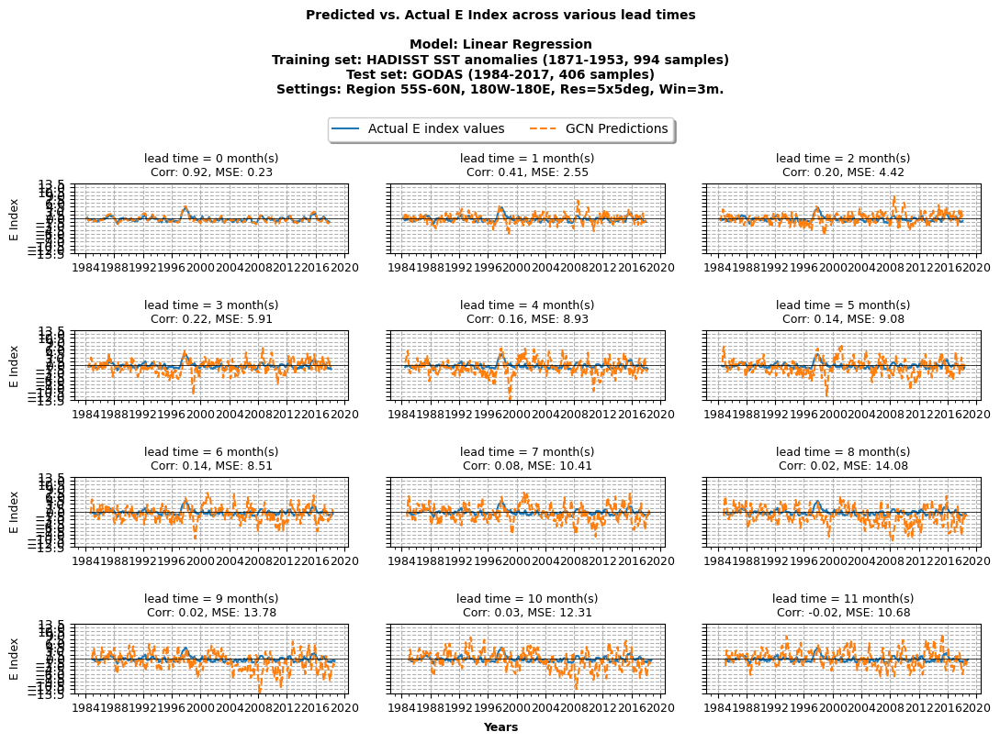

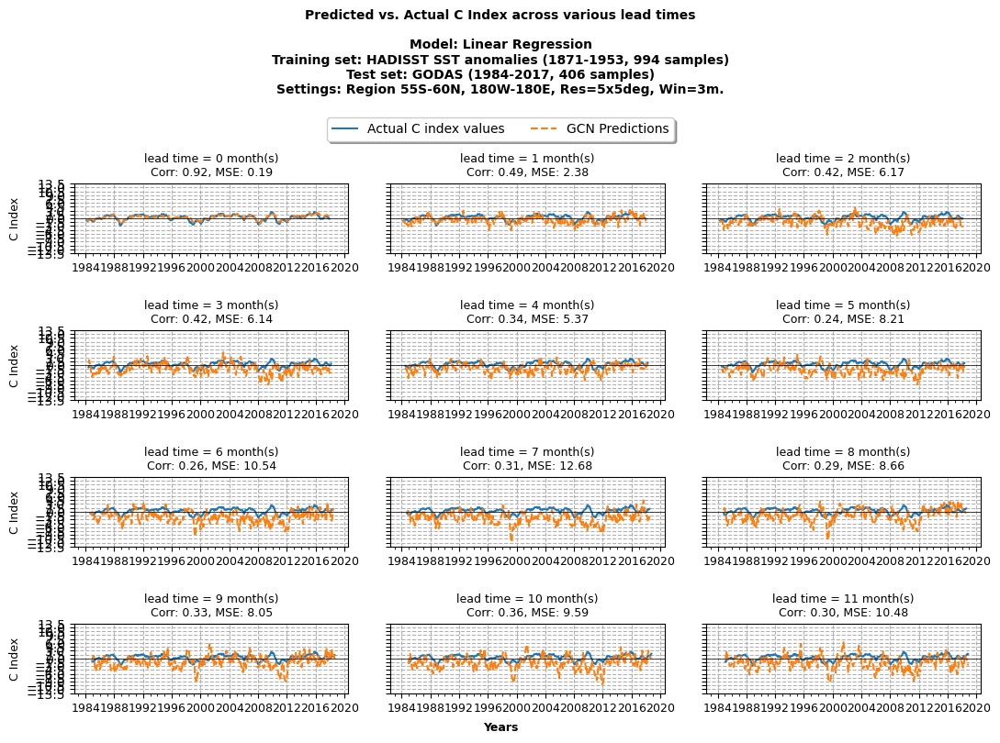

In [38]:
for target in TARGETS:
    graph_utils.plot_pred_vs_actual_timeseries(lr_results, target, abs_v_max, rows_to_show=4, 
                                               subtitle=lr_subtitle, save_img=False, img_filename=None, img_folder=None)

#### Plot LR learned coefficients

##### Bar chart

In [39]:
if USE_PCA:
    nb_weights_details = f'PCA components'
else:
    nb_weights_details = f'{nb_lon_gridpoints}x{nb_lat_gridpoints}'
nb_weights_details


'72x23'

In [40]:
lat_dim = X_train_example_spatial.coords['lat'].values  # array of lat coordinates
lon_dim = X_train_example_spatial.coords['lon'].values  # array of lon coordinates
lonlat_coord_pairs = list(itertools.product(lat_dim, lon_dim))
lonlat_coord_pairs[:3]

[(-52.5, 2.5), (-52.5, 7.5), (-52.5, 12.5)]

In [41]:
NB_LEADS_TO_DISPLAY = 5

In [42]:
max_lr_weight = 0
for target in TARGETS:
    print(f"Target: {target} index")
    for lead_time in range(0, MAX_LEAD_TIME)[:NB_LEADS_TO_DISPLAY]: 
        lr_weights = lr_results[target][lead_time]['weights']
        max_lr_weight = max(max_lr_weight, max(np.abs(lr_weights)))

max_lr_weight = max_lr_weight / 4
print(f"Max linear regression absolute weight accross the first {NB_LEADS_TO_DISPLAY} lead times: {max_lr_weight:.3f}")

Target: E index
Target: C index
Max linear regression absolute weight accross the first 5 lead times: 0.096


In [43]:
# if RESOLUTION != 1:  # takes too long for high resolutions
#     for target in TARGETS:
#         print(f"Target: {target} index")
#         for lead_time in range(0, MAX_LEAD_TIME)[:NB_LEADS_TO_DISPLAY]: 
#             if USE_PCA:
#                 graph_utils.plot_weights_bars_pca(lr_results, target, lead_time, pca_components=PCA_COMPONENTS, vmax=False, subtitle=lr_subtitle)
#             else:
#                 graph_utils.plot_weights_bars_v2(lr_results, target, lead_time, INPUT_TIME_STEPS, nb_lon_gridpoints, nb_lat_gridpoints, lonlat_coord_pairs, invalid_indices=sorted_invalid_lonlat_indices, vmax=False, subtitle=lr_subtitle)
#         print()
#         print("==========================================================================================================================================================================")
#     print(max_lr_weight)

##### Heat map

Target: E index
weights.shape:  (4968,)


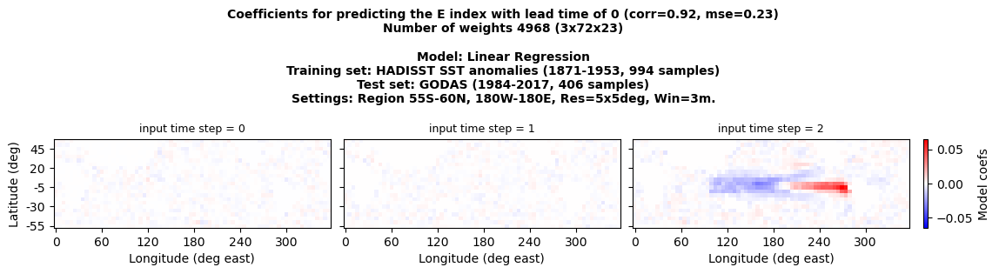


weights.shape:  (4968,)


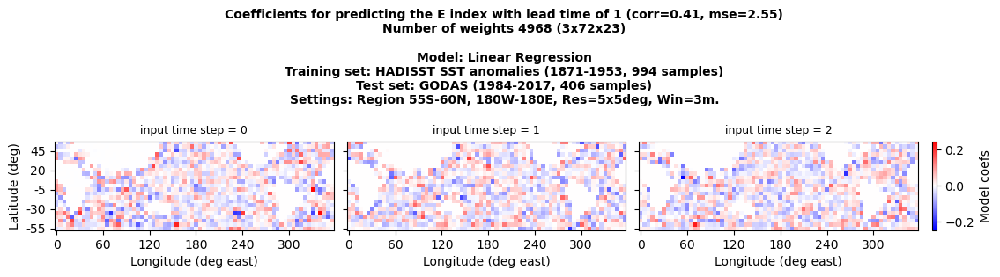


weights.shape:  (4968,)


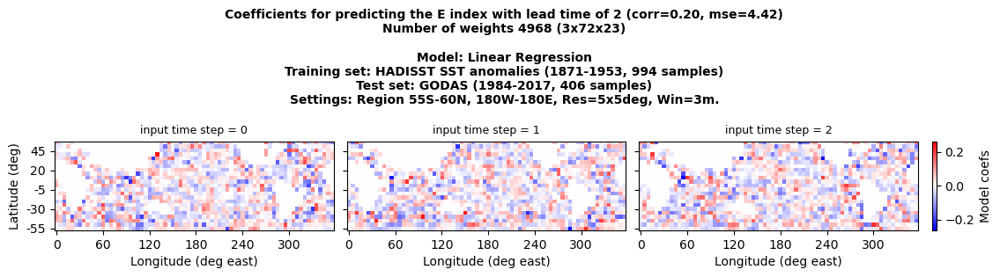


weights.shape:  (4968,)


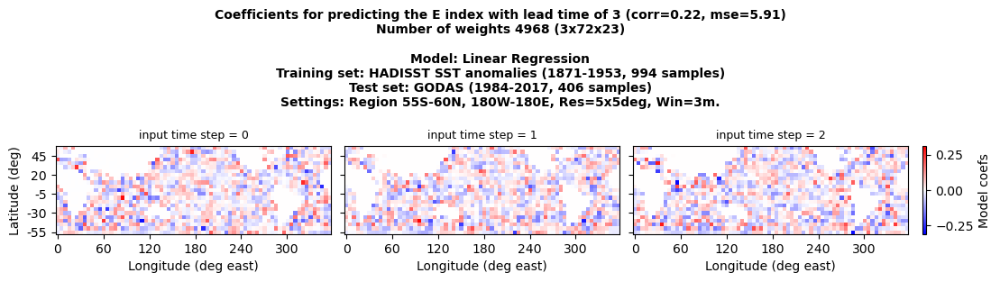


weights.shape:  (4968,)


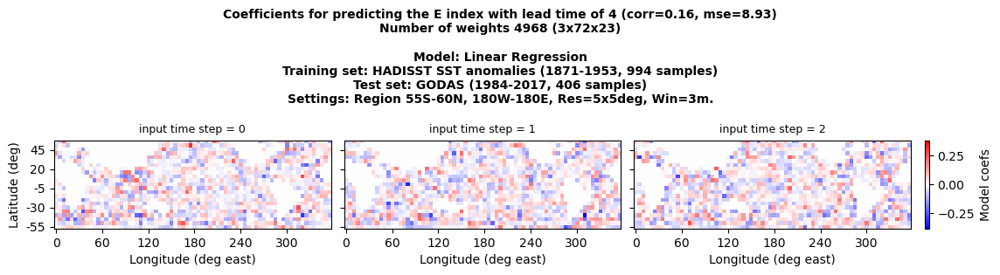


Target: C index
weights.shape:  (4968,)


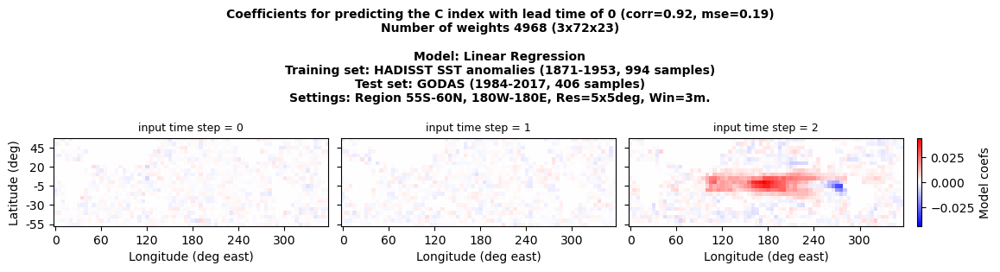


weights.shape:  (4968,)


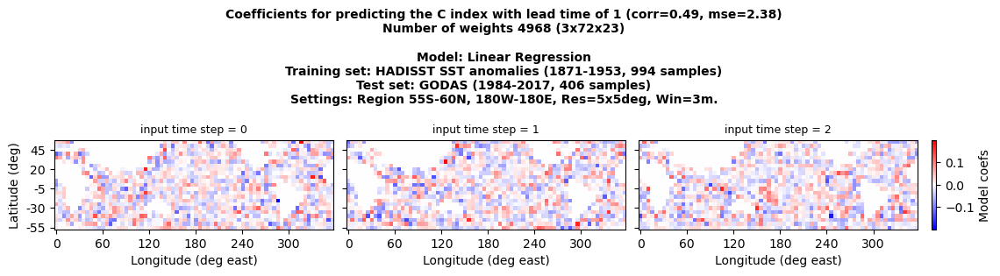


weights.shape:  (4968,)


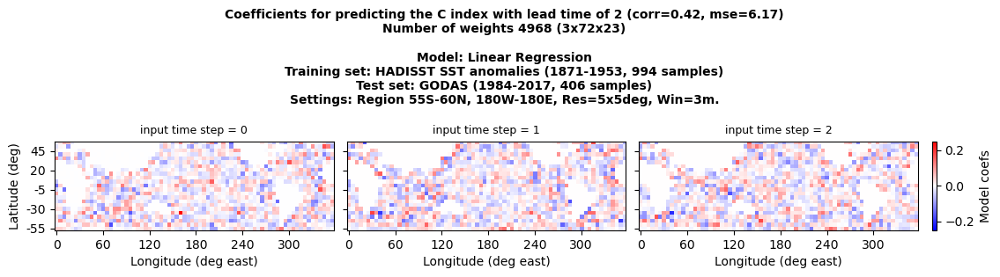


weights.shape:  (4968,)


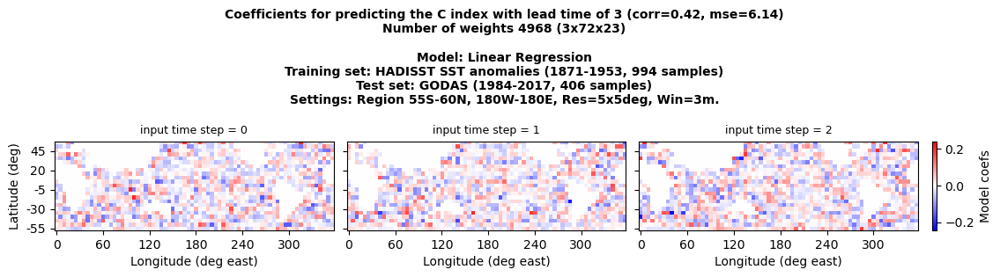


weights.shape:  (4968,)


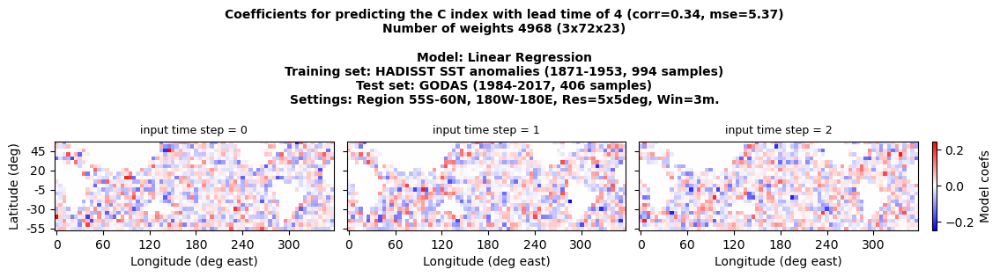

In [44]:
if USE_PCA==False:
    for target in TARGETS:
        print(f"Target: {target} index")
        for lead_time in range(0, MAX_LEAD_TIME)[:NB_LEADS_TO_DISPLAY]: 
            graph_utils.plot_weights_on_grid(lr_results, target, lead_time, INPUT_TIME_STEPS, MIN_LON, MAX_LON, MIN_LAT, MAX_LAT, RESOLUTION, nb_lon_gridpoints, nb_lat_gridpoints, lr_subtitle)
            print()
    
        print("==========================================================================================================================================================================")
        

### Ridge Regression

#### Select best alpha using cross-validation
Select best regularization coefficient alpha using cross-validation

In [45]:
# improved cross validtaion


# perform cross-validation to select best regularization coefficient alpha
lead_time = 1
ridge_cv_results = {}


for target in TARGETS:
    print(f"======================================================================================================")
    print(f"Target = {target}")
    ridge_cv_results[target] = []

    # TRAIN data
    # Step 1: Assemble graph predictors predictands from multiple sources
    X_train_list, y_train_list = [], []
    for source_id in TRAIN_SOURCE_IDS:
        print(f"Assemble Train predictors and predictands from source_id: {source_id}")
        
       # Assemble training and validation datasets for the specified lead time
        X_train, y_train = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, target, train_start_date, train_end_date, 
                                                                             lead_time=lead_time, num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE,  
                                                                             data_format="flatten", use_pca=USE_PCA, pca_components=PCA_COMPONENTS, fill_nan=True, remove_win=False, verbose=False)
        X_val, y_val = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, target, val_start_date, val_end_date, 
                                                                           lead_time=lead_time, num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE,  
                                                                           data_format="flatten", use_pca=USE_PCA, pca_components=PCA_COMPONENTS, fill_nan=True, remove_win=False, verbose=False)
        X_train_list.append(X_train)
        y_train_list.append(y_train)
    
    # Concatenate train data from all sources
    X_train = np.concatenate(X_train_list, axis=0)
    y_train = pd.concat(y_train_list)
    
    
    print(f"\nConcatenate train data from all sources:")
    print(f"• {'Concat':<12}: X_train.shape: {X_train.shape}, y_train.shape: {y_train.shape}, X_val.shape: {X_val.shape}, y_val.shape: {y_val.shape}")
    


    tscv = TimeSeriesSplit(n_splits=3)

    # Iterate over a list of different regularization strengths (alpha values)
    for alpha in [1, 10, 100, 1000, 5000, 8000, 10000]:

        corr_scores, mse_scores = [], []
        
        for train_index, val_index in tscv.split(X_train):
            X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
            y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

            # Train the model on the training fold using the specified regularization strength
            ridge_regr = sklearn.linear_model.Ridge(alpha=alpha)
            ridge_regr.fit(X_train_fold, y_train_fold)
    
            # Evaluate the model on the validation fold
            predictions = ridge_regr.predict(X_val_fold)
            corr, _ = scipy.stats.pearsonr(predictions, y_val_fold)
            mse = mean_squared_error(y_val_fold, predictions)

            # Append metrics for this fold
            corr_scores.append(corr)
            mse_scores.append(mse)

        # Average metrics over all folds
        avg_corr = np.mean(corr_scores)
        avg_mse = np.mean(mse_scores)

        # Store model performance metrics and coefficients in a dictionary for the current regularization strength
        cv_result = { 
            'source_id': source_id, 
            'lead_time': lead_time,
            'train_start_date': train_start_date,
            'train_end_date': train_end_date,
            'alpha': alpha,
            'avg_corr': avg_corr,
            'avg_mse': avg_mse,
        }
        ridge_cv_results[target].append(cv_result)
        # print(f'alpha = {alpha:>10}: Predicted and True {target} Indices at {lead_time} Months Lead Time: Corr: {corr:.5f}, MSE: {mse:.6f}')
        print(f'alpha = {alpha:>10}: Average Corr: {avg_corr:.5f}, Average MSE: {avg_mse:.6f}')


Target = E
Assemble Train predictors and predictands from source_id: HADISST

Concatenate train data from all sources:
• Concat      : X_train.shape: (994, 4968), y_train.shape: (994,), X_val.shape: (118, 4968), y_val.shape: (118,)
alpha =          1: Average Corr: 0.64959, Average MSE: 0.471275
alpha =         10: Average Corr: 0.69811, Average MSE: 0.373939
alpha =        100: Average Corr: 0.75817, Average MSE: 0.275814
alpha =       1000: Average Corr: 0.77301, Average MSE: 0.253209
alpha =       5000: Average Corr: 0.73950, Average MSE: 0.295515
alpha =       8000: Average Corr: 0.72085, Average MSE: 0.319954
alpha =      10000: Average Corr: 0.71054, Average MSE: 0.333595
Target = C
Assemble Train predictors and predictands from source_id: HADISST

Concatenate train data from all sources:
• Concat      : X_train.shape: (994, 4968), y_train.shape: (994,), X_val.shape: (118, 4968), y_val.shape: (118,)
alpha =          1: Average Corr: 0.68489, Average MSE: 0.350208
alpha =         

In [46]:
IMG_FOLDER

'img/pf_lr_rr_Target_EC/'

In [47]:
r'$\lambda$'

'$\\lambda$'

Target = E


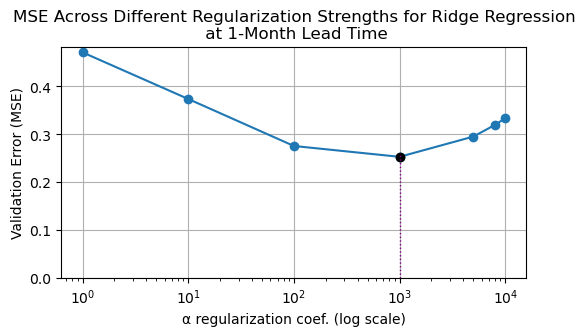

The regularization coefficient with the minimum MSE is alpha=1000 with an MSE of 0.2532
Target = C


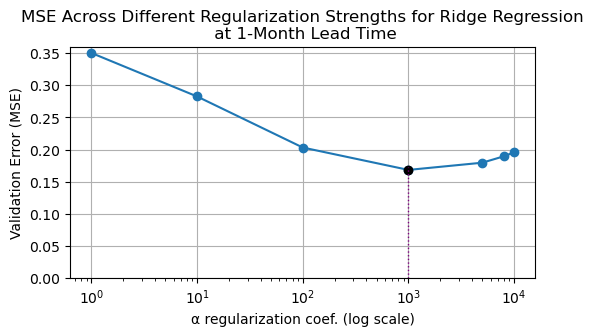

The regularization coefficient with the minimum MSE is alpha=1000 with an MSE of 0.1683


In [48]:
for target in TARGETS:
    print(f"======================================================================================================")
    print(f"Target = {target}")
    # Extract alpha and mse values
    alphas = [entry['alpha'] for entry in ridge_cv_results[target]]
    rmses = [entry['avg_mse'] for entry in ridge_cv_results[target]]
    
    # Find alpha value corresponding to the minimum MSE
    min_rmse_index = rmses.index(min(rmses))
    min_rmse_alpha = alphas[min_rmse_index]
    
    # Plot MSE vs alpha values
    plt.figure(figsize=(6, 3))
    plt.plot(alphas, rmses, marker='o')  # Line plot with circle markers
    plt.plot(min_rmse_alpha, min(rmses), marker='o', c='black')  # Line plot with circle markers
    
    # Customize the plot
    plt.xlabel('α regularization coef. (log scale)')
    plt.ylabel('Validation Error (MSE)')
    plt.ylim([0, None])
    plt.xscale('log')
    plt.grid(True)
    plt.axvline(x=min_rmse_alpha, ymin=0,  ymax=min(rmses)/max(rmses), color='purple', linestyle='dotted', linewidth=1)

    img_filename = "ridge_regr_alpha_tuning_cross_val.jpg"
    plt.savefig(IMG_FOLDER+img_filename, dpi=300, bbox_inches='tight')
    plt.title(f'MSE Across Different Regularization Strengths for Ridge Regression\n at {ridge_cv_results[target][-1]['lead_time']}-Month Lead Time')

    plt.show()    
    
    print(f"The regularization coefficient with the minimum MSE is alpha={min_rmse_alpha} with an MSE of {min(rmses):.4f}")




#### Train Ridge regression models across different lead times

Train Ridge regression models across different lead times and evaluate their performance in predicting ONI indices 

In [49]:
print(f"Ridge regressor trained on {TRAIN_SOURCE_IDS} data ({utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}) from {train_start_date} to {train_end_date}")

Ridge regressor trained on ['HADISST'] data (55S-60N-180W-180E) from 1871-01-01 to 1953-12-31


In [50]:
start_time_training = time.time()
start_time_training_datetime = datetime.fromtimestamp(start_time_training)
print("Start training time: ", start_time_training_datetime.strftime('%Y-%m-%d %H:%M:%S'))

Start training time:  2024-08-16 00:36:10


In [51]:
verbose = True
alpha = min_rmse_alpha

print(f"Ridge regressor trained on {TRAIN_SOURCE_IDS} data ({utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}) from {train_start_date} to {train_end_date}")

rr_results = {}
for target in TARGETS:
    print(f"======================================================================================================")
    print(f"Target = {target}")

    rr_results[target] = []
    
    for lead_time in range(0, MAX_LEAD_TIME, 1):
        print(f"------------------------------------------------------------------------------------------------------")
        print(f"Lead Time: {lead_time}")
    
        rr_experiment_name = (
            f"RR_"
            f"Train_{TRAIN_SOURCE_IDS_FILENAME}_"
            f"{train_start_year}-{train_end_year}_"
            f"Test_{TEST_SOURCE_ID_FILENAME}_"
            f"{test_start_year}-{test_end_year}_"
            f"Win{INPUT_TIME_STEPS:02d}_"
            f"{utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}_"
            f"Res{RESOLUTION}_"
            f"{target.capitalize()}Idx_"
            f"Lead{lead_time:02d}"
        )

        # TRAIN data
        # Step 1: Assemble graph predictors predictands from multiple sources
        X_train_list, y_train_list = [], []
        for source_id in TRAIN_SOURCE_IDS:
            print(f"Assemble Train predictors and predictands from source_id: {source_id}")
            
           # Assemble training and validation datasets for the specified lead time
            X_train, y_train = graph_utils.assemble_graph_predictors_predictands(source_id, RESOLUTION, target, train_start_date, train_end_date, 
                                                                                 lead_time=lead_time, num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE,  
                                                                                 data_format="flatten", use_pca=USE_PCA, pca_components=PCA_COMPONENTS, fill_nan=True, remove_win=False, verbose=verbose)
            X_train_list.append(X_train)
            y_train_list.append(y_train)
        
        # Concatenate train data from all sources
        X_train = np.concatenate(X_train_list, axis=0)
        y_train = pd.concat(y_train_list)
        
        # print(f"\nConcatenate train data from all sources:")
        print(f"• X_train.shape: {X_train.shape}, y_train.shape: {y_train.shape}")
        # print(f"y_train: {y_train}")
        

        # Train a Ridge regression model using the training data
        print(f"\nTrain Ridge regression model:")
        ridge_regr = sklearn.linear_model.Ridge(alpha=alpha)
        display(ridge_regr)
        ridge_regr.fit(X_train,y_train)


        # Evaluate the model on the test data
        print(f"Assemble Test predictors and predictands from source_id: {TEST_SOURCE_ID}")
        X_test, y_test = graph_utils.assemble_graph_predictors_predictands(TEST_SOURCE_ID, RESOLUTION, target, test_start_date, test_end_date, 
                                                                           lead_time=lead_time, num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE,  
                                                                           data_format="flatten", use_pca=USE_PCA, pca_components=PCA_COMPONENTS, fill_nan=True, remove_win=False, verbose=verbose)
        print(f"• X_test.shape: {X_test.shape}, y_test.shape: {y_test.shape}")


        
        
        # Evaluate the model on the validation data
        predictions = ridge_regr.predict(X_test)
        corr, _ = scipy.stats.pearsonr(predictions, y_test)
        mse = mean_squared_error(y_test, predictions)
    
        # Store model performance metrics and coefficients in a dictionary for the current lead time
        rr_dict = { 
            'model_name': 'Ridge Regression',
            'experiment_name': rr_experiment_name,
            'train_source_ids': TRAIN_SOURCE_IDS,
            'test_source_id': TEST_SOURCE_ID,
            'nb_train_samples': X_train.shape[0],
            'nb_test_samples': X_test.shape[0],
            'target': target, 
            'train_start_date': train_start_date,
            'train_end_date': train_end_date,
            'val_start_date': None,
            'val_end_date': None,
            'test_start_date': test_start_date,
            'test_end_date': test_end_date,
            'lead_time': lead_time,
            'num_input_time_steps': INPUT_TIME_STEPS,
            'y_test': y_test,
            'predictions': predictions,
            'corr': corr, 
            'mse': mse,
            'weights': ridge_regr.coef_,
            'alpha': alpha,
        }
        rr_results[target].append(rr_dict)
        
        print(f'Predicted and True {target} Indices at {lead_time} Months Lead Time: Corr: {corr:.2f}, MSE: {mse:.2f}')
        # plot_nino_time_series(y_test, predictions, source_id,
        #     f'Predicted and True {target} indices at {lead_time} Month Lead Time\nCorr: {corr:.2f}, MSE: {mse:.2f}')

Ridge regressor trained on ['HADISST'] data (55S-60N-180W-180E) from 1871-01-01 to 1953-12-31
Target = E
------------------------------------------------------------------------------------------------------
Lead Time: 0
Assemble Train predictors and predictands from source_id: HADISST

Predictors:
• Search for `HADISST` SST file in datasets/HadISST/HadISST_regridded/anom_1m_5x5deg
• Load OBS.HAD.HADISST.regridded_tos_anom_1m_5x5deg.nc (1870-01-16 to 2024-02-15)
• Slice the time period from 1871-01-01 to 1953-12-31
• Nb of original samples (nb months): 996
• Nb of output samples, each containing 3 time steps: 994
• Reshape sst anomalies into a 2D (994, 4968) array: 994 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 1,019,850 nan values (continents) out of 4,938,192 with 0's (20.65%)
• The dimensions are: (994, 4968): 994 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `HADISST` target file in datasets/HadISST/HadISST_regrid

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 00 month(s) lead time and 2 months offset: from 1984-03-01 to 2017-12-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 01 month(s) lead time and 2 months offset: from 1984-04-01 to 2018-01-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 02 month(s) lead time and 2 months offset: from 1984-05-01 to 2018-02-28
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 03 month(s) lead time and 2 months offset: from 1984-06-01 to 2018-03-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 04 month(s) lead time and 2 months offset: from 1984-07-01 to 2018-04-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 05 month(s) lead time and 2 months offset: from 1984-08-01 to 2018-05-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 06 month(s) lead time and 2 months offset: from 1984-09-01 to 2018-06-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 07 month(s) lead time and 2 months offset: from 1984-10-01 to 2018-07-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 08 month(s) lead time and 2 months offset: from 1984-11-01 to 2018-08-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 09 month(s) lead time and 2 months offset: from 1984-12-01 to 2018-09-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 10 month(s) lead time and 2 months offset: from 1985-01-01 to 2018-10-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 11 month(s) lead time and 2 months offset: from 1985-02-01 to 2018-11-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 12 month(s) lead time and 2 months offset: from 1985-03-01 to 2018-12-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 13 month(s) lead time and 2 months offset: from 1985-04-01 to 2019-01-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 14 month(s) lead time and 2 months offset: from 1985-05-01 to 2019-02-28
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 15 month(s) lead time and 2 months offset: from 1985-06-01 to 2019-03-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 16 month(s) lead time and 2 months offset: from 1985-07-01 to 2019-04-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 17 month(s) lead time and 2 months offset: from 1985-08-01 to 2019-05-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 18 month(s) lead time and 2 months offset: from 1985-09-01 to 2019-06-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 19 month(s) lead time and 2 months offset: from 1985-10-01 to 2019-07-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 20 month(s) lead time and 2 months offset: from 1985-11-01 to 2019-08-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 21 month(s) lead time and 2 months offset: from 1985-12-01 to 2019-09-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 22 month(s) lead time and 2 months offset: from 1986-01-01 to 2019-10-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 23 month(s) lead time and 2 months offset: from 1986-02-01 to 2019-11-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 24 month(s) lead time and 2 months offset: from 1986-03-01 to 2019-12-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 00 month(s) lead time and 2 months offset: from 1984-03-01 to 2017-12-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 01 month(s) lead time and 2 months offset: from 1984-04-01 to 2018-01-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 02 month(s) lead time and 2 months offset: from 1984-05-01 to 2018-02-28
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 03 month(s) lead time and 2 months offset: from 1984-06-01 to 2018-03-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 04 month(s) lead time and 2 months offset: from 1984-07-01 to 2018-04-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 05 month(s) lead time and 2 months offset: from 1984-08-01 to 2018-05-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 06 month(s) lead time and 2 months offset: from 1984-09-01 to 2018-06-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 07 month(s) lead time and 2 months offset: from 1984-10-01 to 2018-07-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 08 month(s) lead time and 2 months offset: from 1984-11-01 to 2018-08-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 09 month(s) lead time and 2 months offset: from 1984-12-01 to 2018-09-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 10 month(s) lead time and 2 months offset: from 1985-01-01 to 2018-10-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 11 month(s) lead time and 2 months offset: from 1985-02-01 to 2018-11-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 12 month(s) lead time and 2 months offset: from 1985-03-01 to 2018-12-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 13 month(s) lead time and 2 months offset: from 1985-04-01 to 2019-01-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 14 month(s) lead time and 2 months offset: from 1985-05-01 to 2019-02-28
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 15 month(s) lead time and 2 months offset: from 1985-06-01 to 2019-03-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 16 month(s) lead time and 2 months offset: from 1985-07-01 to 2019-04-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 17 month(s) lead time and 2 months offset: from 1985-08-01 to 2019-05-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 18 month(s) lead time and 2 months offset: from 1985-09-01 to 2019-06-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 19 month(s) lead time and 2 months offset: from 1985-10-01 to 2019-07-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 20 month(s) lead time and 2 months offset: from 1985-11-01 to 2019-08-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 21 month(s) lead time and 2 months offset: from 1985-12-01 to 2019-09-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 22 month(s) lead time and 2 months offset: from 1986-01-01 to 2019-10-31
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 23 month(s) lead time and 2 months offset: from 1986-02-01 to 2019-11-30
• The dimensions are: (406

Ridge(alpha=1000)

Assemble Test predictors and predictands from source_id: GODAS

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 24 month(s) lead time and 2 months offset: from 1986-03-01 to 2019-12-31
• The dimensions are: (406

In [52]:
elapsed_time_training_seconds = time.time() - start_time_training
hours_train, remainder_train = divmod(elapsed_time_training_seconds, 3600)
minutes_train, seconds_train = divmod(remainder_train, 60)
hhmmss_elapsed_train_time = f'{int(hours_train):02}:{int(minutes_train):02}:{int(seconds_train):02}'
print(f"\nElapsed time to train the RR: {hhmmss_elapsed_train_time}")  
print(f"• Targets: {TARGETS}")
# print(f"• Lead Times: {START_LEAD_TIME} to {MAX_LEAD_TIME}")
print(f"• Max Lead Time: {MAX_LEAD_TIME}")
print(f"• Window size: {INPUT_TIME_STEPS}")


Elapsed time to train the RR: 00:00:06
• Targets: ['E', 'C']
• Max Lead Time: 25
• Window size: 3


#### Write RR results to txt file

In [53]:
for target in TARGETS:
    print(f"\n\n===========================================================================================")
    print(f"Target:         {target}")

    results_folder = target_to_results_folder.get(target)
    if results_folder is None:
        print(f"Unknown target {target}. Abort")
    save_results_folder = os.path.join(results_folder, "rr")
    os.makedirs(save_results_folder, exist_ok=True) 
    print(save_results_folder)

    rr_dict_save = rr_results[target]
    
    # Access the last entry in the dictionary
    train_experiment_data = rr_results[target][-1]
    # print(train_experiment_data)
    
    # Open the file and write the results
    file_exp_name = train_experiment_data['experiment_name']
    
    filepath = f'{save_results_folder}/results_sum_{file_exp_name}.txt'
    print(f"Save results as text file to {filepath}")
    with open(f'{filepath}', 'w') as f:
        f.write(f"Experiment Name: {train_experiment_data['experiment_name']}\n")
        f.write(f"Model Name: {train_experiment_data['model_name']}\n")
        f.write(f"Train Source IDs: {train_experiment_data['train_source_ids']}\n")
        f.write(f"Test Source ID: {train_experiment_data['test_source_id']}\n")
        # f.write(f"Number of Training Samples: {train_experiment_data['nb_train_samples']}\n")
        # f.write(f"Number of Test Samples: {train_experiment_data['nb_test_samples']}\n")
        f.write(f"Target: {train_experiment_data['target']}\n")
        f.write(f"Training Start Date: {train_experiment_data['train_start_date']}\n")
        f.write(f"Training End Date: {train_experiment_data['train_end_date']}\n")
        f.write(f"Validation Start Date: {train_experiment_data['val_start_date']}\n")
        f.write(f"Validation End Date: {train_experiment_data['val_end_date']}\n")
        f.write(f"Test Start Date: {train_experiment_data['test_start_date']}\n")
        f.write(f"Test End Date: {train_experiment_data['test_end_date']}\n")
        f.write(f"Resolution: {RESOLUTION}\n")
        f.write(f"Region: {utils.add_cardinals_title(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}\n")
        f.write(f"Number of Input Time Steps: {train_experiment_data['num_input_time_steps']}\n")
        f.write("\n")
        # f.write(f"GPU: {torch.cuda.get_device_name(0)}\n")
        f.write(f"Targets: {TARGETS}\n")
        f.write(f"Max Lead Time: {MAX_LEAD_TIME}\n")
        f.write(f"Window size: {INPUT_TIME_STEPS}\n")
        f.write(f"\nModel Architecture:\n{str(ridge_regr)}\n")

        # Calculate the number of parameters
        num_params = len(ridge_regr.coef_) + (1 if ridge_regr.fit_intercept else 0)
        f.write(f"\nTotal number of parameters: {num_params:,}\n")
        f.write(f"Parameter details:\n")
        f.write(f"    coefs:     {len(ridge_regr.coef_):,}\n")
        f.write(f"    intercept: {(1 if ridge_regr.fit_intercept else 0)}\n")


        f.write(f"\n\n\n\n------------------------------------------------------------------------\n")
        f.write(f"Training:\n")
        f.write(f"\nElapsed time to train the rr for all leads: {hhmmss_elapsed_train_time}\n")  
            
        for lead_time in range(0, MAX_LEAD_TIME, 1):
            # print(lead_time)
            rr_dict_lead = rr_dict_save[lead_time]
            f.write(f"• Lead time: {lead_time:>2},   Corr: {rr_dict_lead['corr']:.4f},   MSE: {rr_dict_lead['mse']:.4f}\n")



Target:         E
saved_results/ec/rr
Save results as text file to saved_results/ec/rr/results_sum_RR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx_Lead24.txt


Target:         C
saved_results/ec/rr
Save results as text file to saved_results/ec/rr/results_sum_RR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx_Lead24.txt


#### Plot RR forecasts versus actual ONI time-series

In [54]:
for target in TARGETS:
    alpha = rr_results[target][0]['alpha']
    nb_train_samples = rr_results[target][0]['nb_train_samples']
    nb_test_samples = rr_results[target][0]['nb_test_samples']
    rr_subtitle = (
        f'Model: Ridge Regression (α = {alpha})\n'
        f'Training set: {TRAIN_SOURCE_IDS_STR} SST anomalies ({train_start_year}-{train_end_year}, {nb_train_samples} samples)\n' 
        f'Test set: {TEST_SOURCE_ID} ({test_start_year}-{test_end_year}, {nb_test_samples} samples)\n'
        f'Settings: Region {COORDINATES}, Res={RESOLUTION}x{RESOLUTION}deg, Win={INPUT_TIME_STEPS}m.\n\n'
    )
    print(rr_subtitle)

Model: Ridge Regression (α = 1000)
Training set: HADISST SST anomalies (1871-1953, 994 samples)
Test set: GODAS (1984-2017, 406 samples)
Settings: Region 55S-60N, 180W-180E, Res=5x5deg, Win=3m.


Model: Ridge Regression (α = 1000)
Training set: HADISST SST anomalies (1871-1953, 994 samples)
Test set: GODAS (1984-2017, 406 samples)
Settings: Region 55S-60N, 180W-180E, Res=5x5deg, Win=3m.




In [55]:
# get maximum abs value and use it for y_min and y_max
for target in TARGETS:
    for rr_dict in rr_results[target]:
        v_min, v_max = np.inf, -np.inf
        v_min = min(v_min, rr_dict['predictions'].min(), rr_dict['y_test'].min())
        v_max = max(v_max, rr_dict['predictions'].max(), rr_dict['y_test'].max())
        abs_v_max = max(abs(v_min), abs(v_max))

# add 1 to get a little margin
abs_v_max = abs_v_max + 1
print(f"Maximum Absolute Value +1 for actual and predicted {TARGETS} target(s): {abs_v_max:.2f}")

Maximum Absolute Value +1 for actual and predicted ['E', 'C'] target(s): 3.84


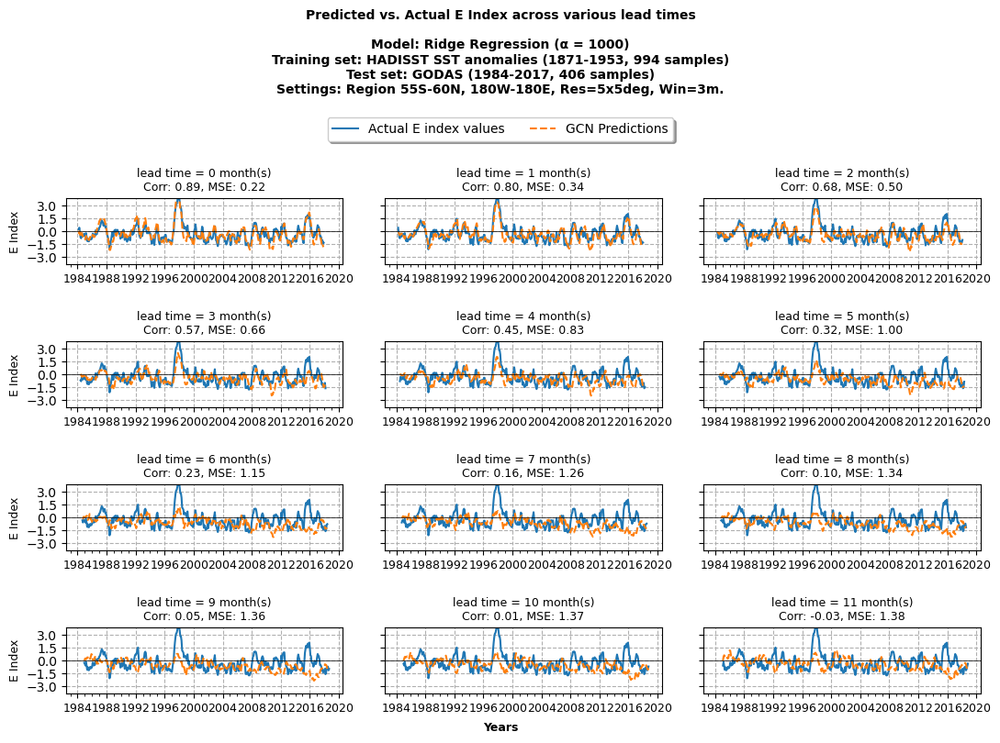

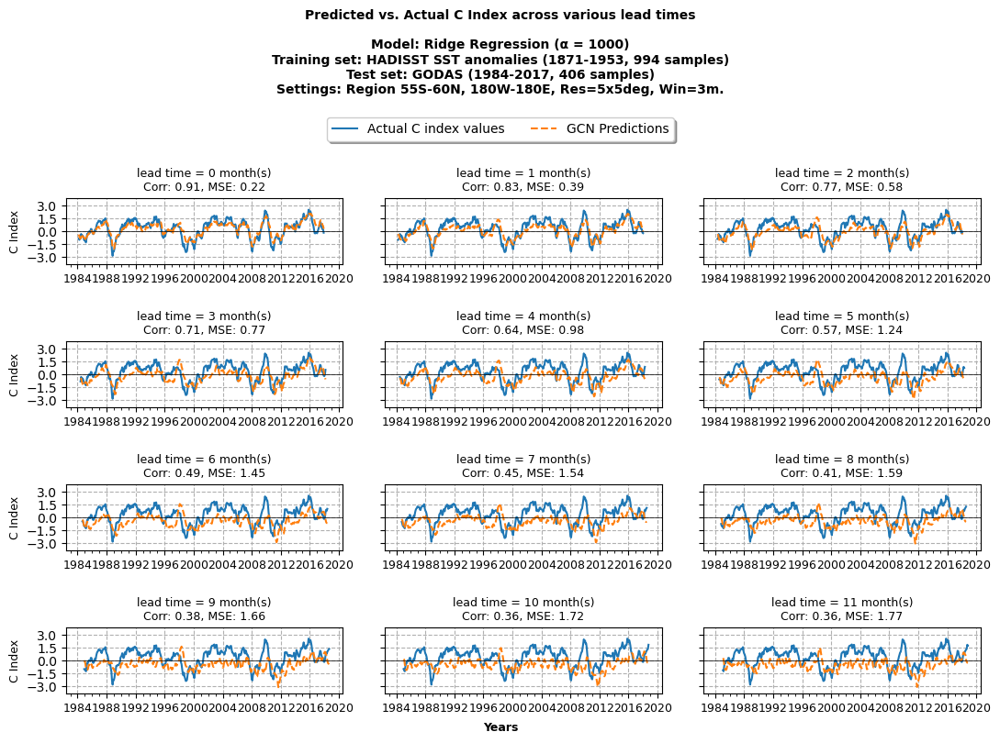

In [56]:
for target in TARGETS:
    graph_utils.plot_pred_vs_actual_timeseries(rr_results, target, abs_v_max, rows_to_show=4, 
                                               subtitle=rr_subtitle, save_img=False, img_filename=None, img_folder=None)

#### Plot RR learned coefficients

Target: E index
weights.shape:  (4968,)
weights_3d.shape:  (3, 72, 23)


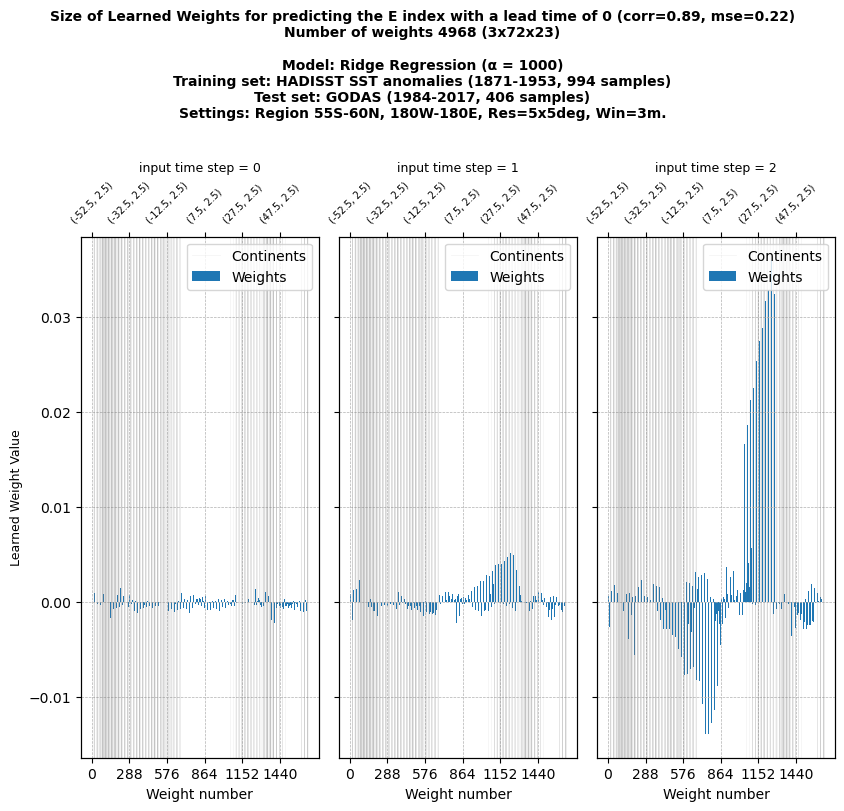

weights.shape:  (4968,)
weights_3d.shape:  (3, 72, 23)


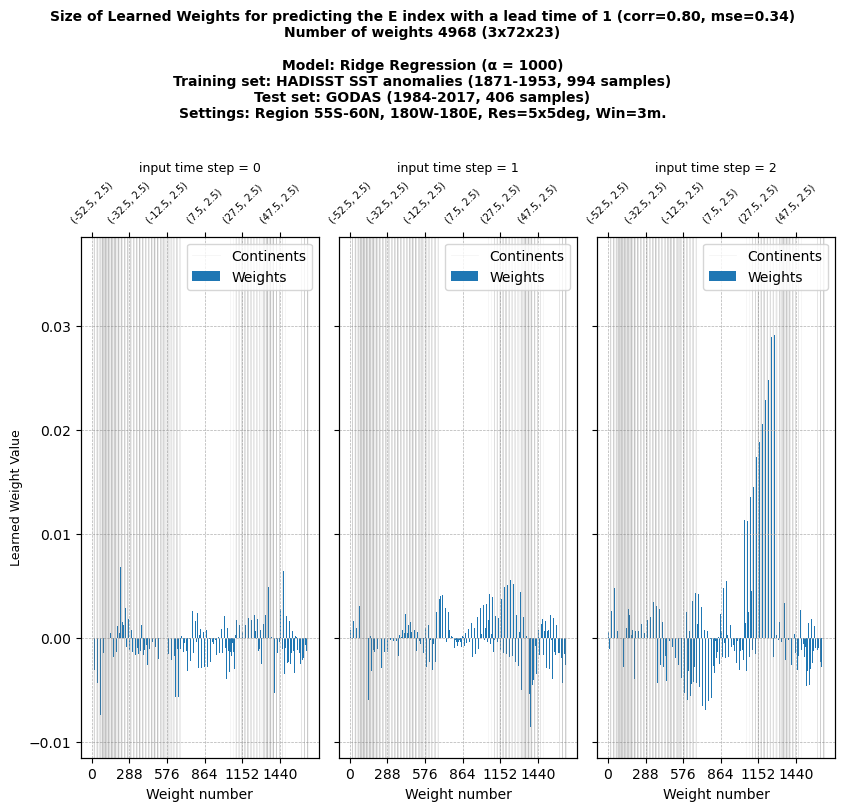

weights.shape:  (4968,)
weights_3d.shape:  (3, 72, 23)


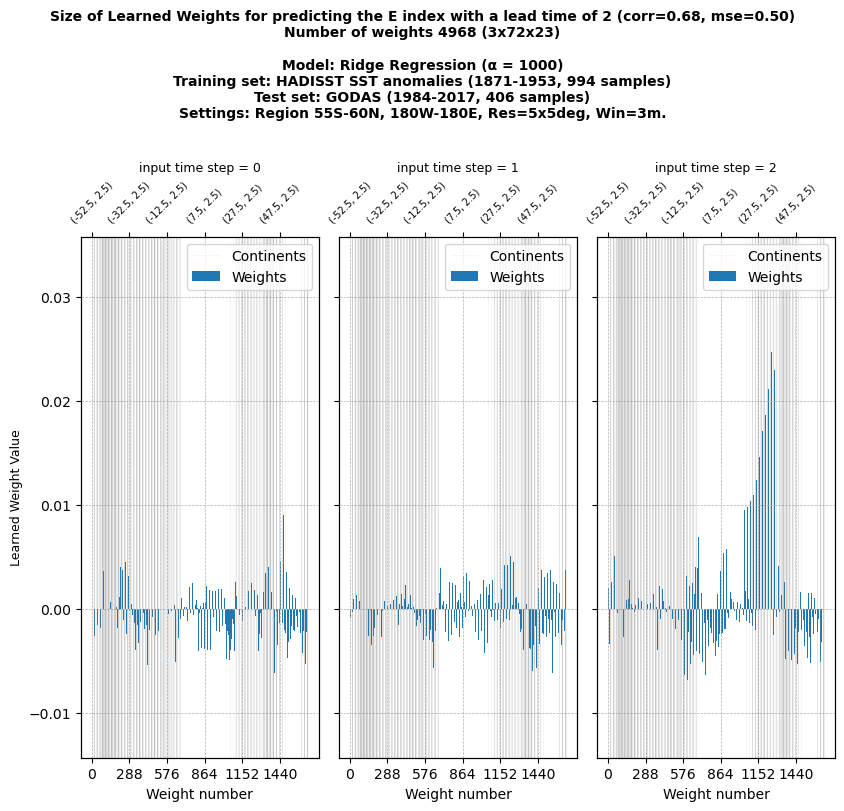

weights.shape:  (4968,)
weights_3d.shape:  (3, 72, 23)


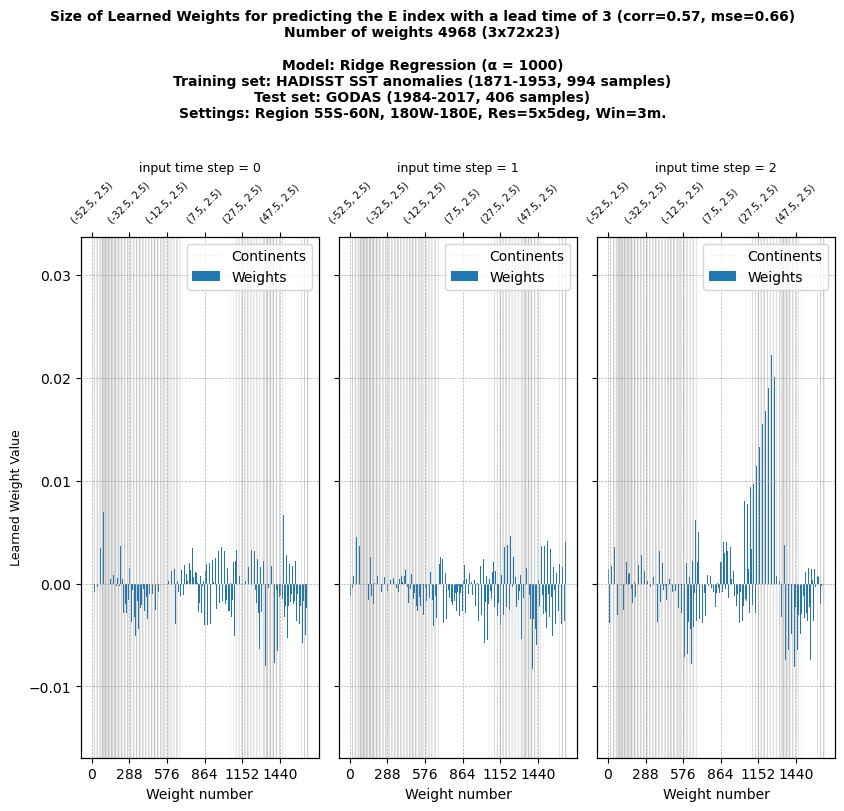

weights.shape:  (4968,)
weights_3d.shape:  (3, 72, 23)


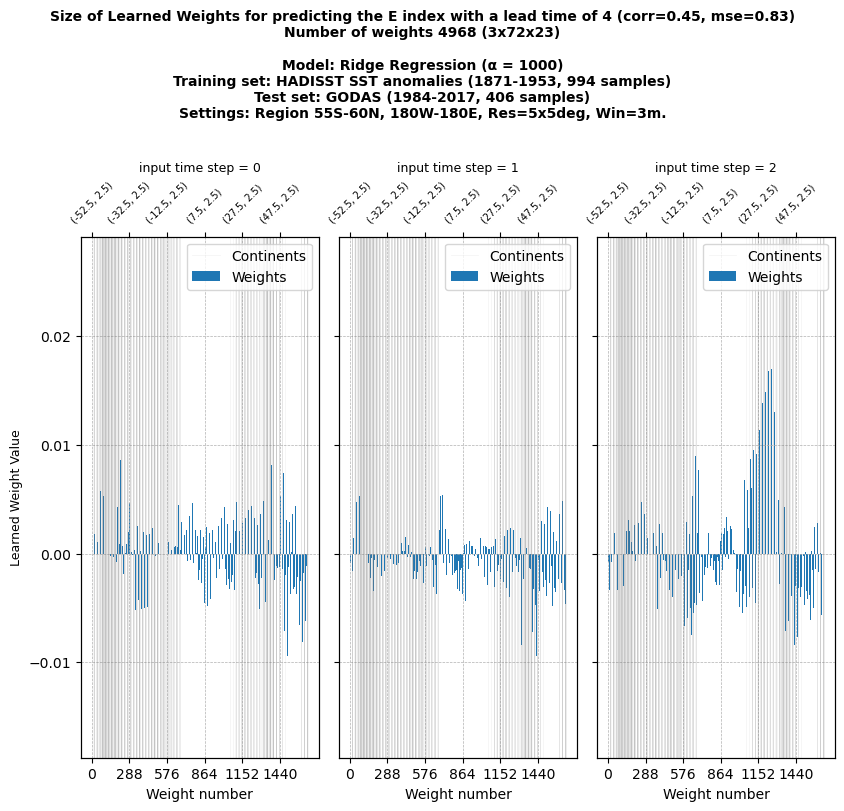


Target: C index
weights.shape:  (4968,)
weights_3d.shape:  (3, 72, 23)


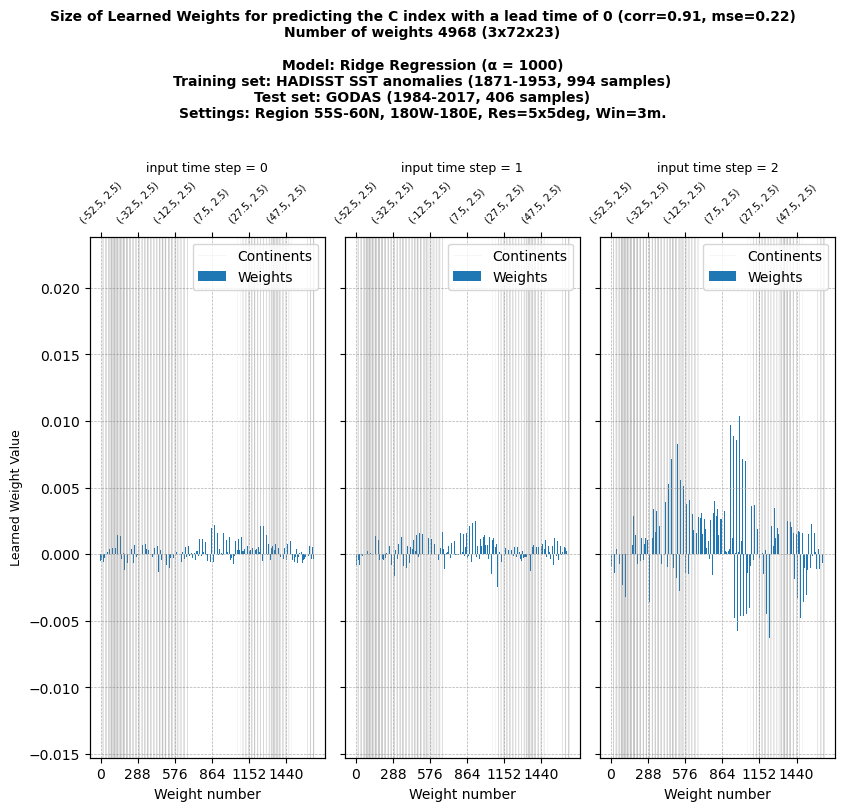

weights.shape:  (4968,)
weights_3d.shape:  (3, 72, 23)


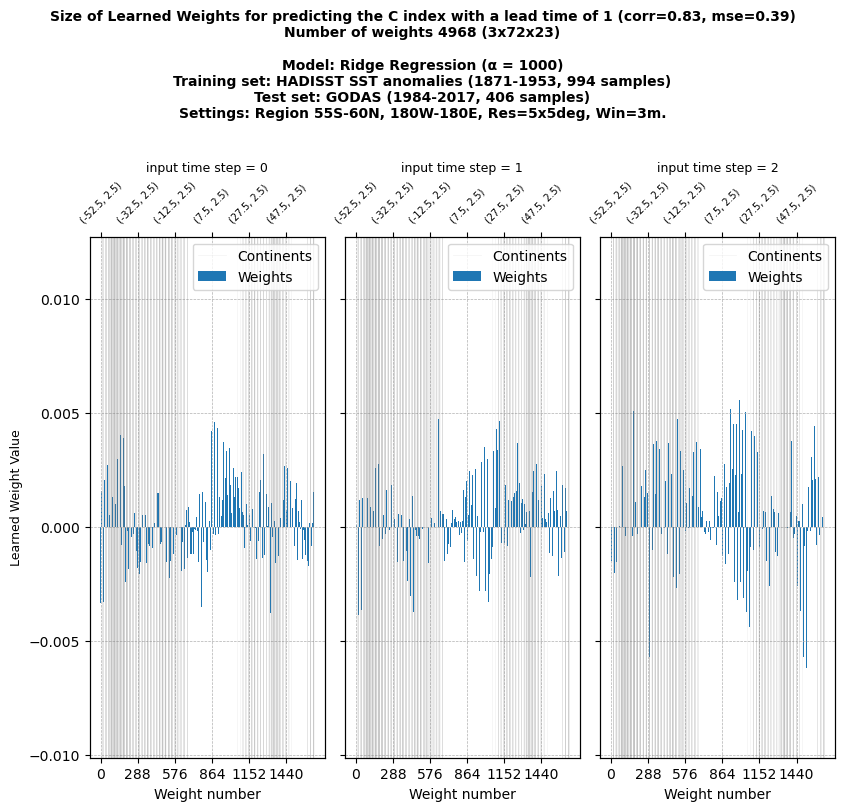

weights.shape:  (4968,)
weights_3d.shape:  (3, 72, 23)


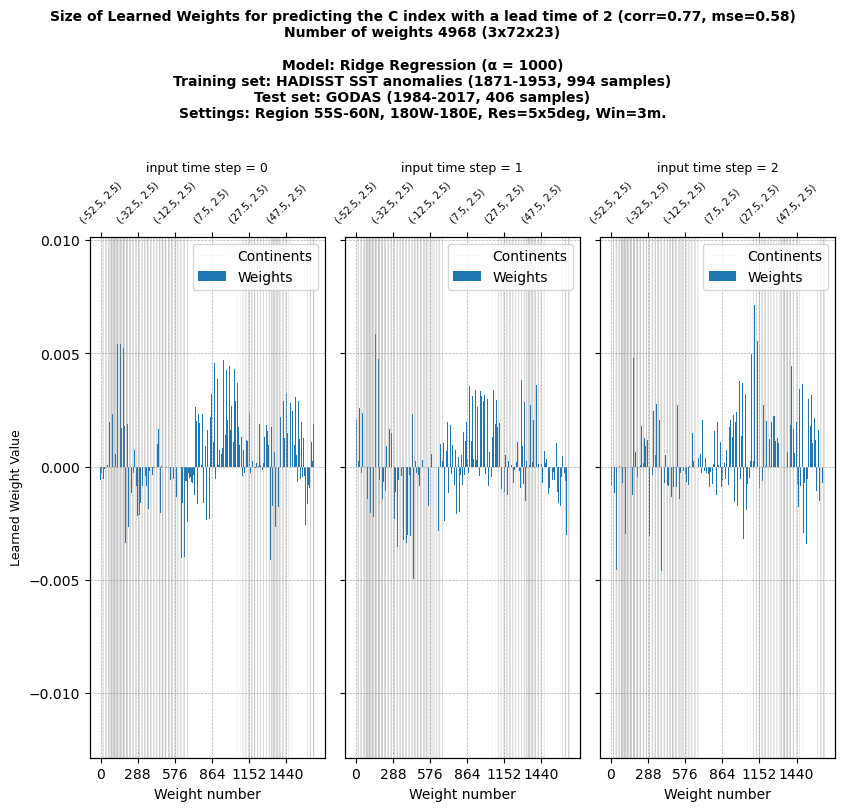

weights.shape:  (4968,)
weights_3d.shape:  (3, 72, 23)


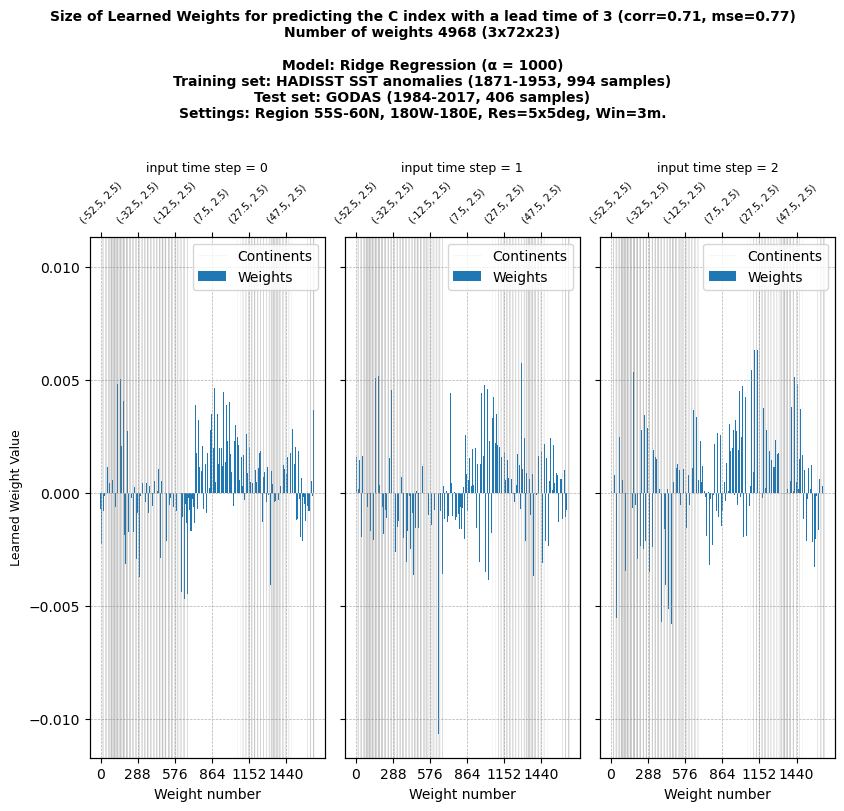

weights.shape:  (4968,)
weights_3d.shape:  (3, 72, 23)


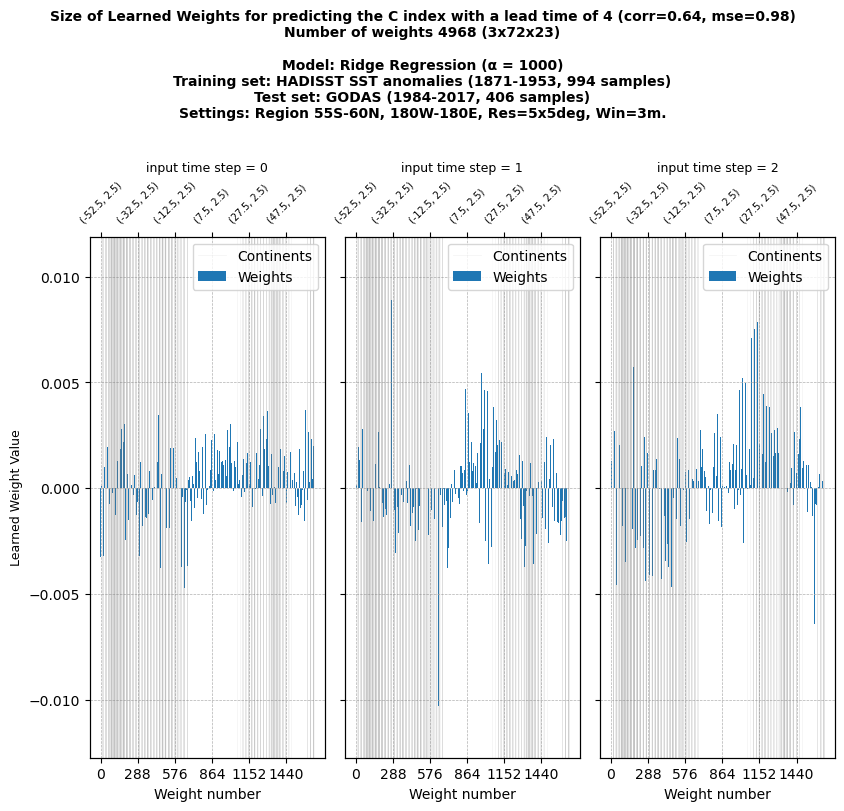

In [57]:
if RESOLUTION != 1:  # takes too long for high resolutions
    for target in TARGETS:
        print(f"Target: {target} index")
        for lead_time in range(0, MAX_LEAD_TIME)[:NB_LEADS_TO_DISPLAY]: 
                
            # Use the max of the linear regression weights for the y scale limit for a fair comparison
            graph_utils.plot_weights_bars_v2(rr_results, target, lead_time, INPUT_TIME_STEPS, nb_lon_gridpoints, nb_lat_gridpoints, lonlat_coord_pairs, invalid_indices=sorted_invalid_lonlat_indices, vmax=None, subtitle=rr_subtitle)
        
        print()
        print("==========================================================================================================================================================================")

Target: E index
weights.shape:  (4968,)


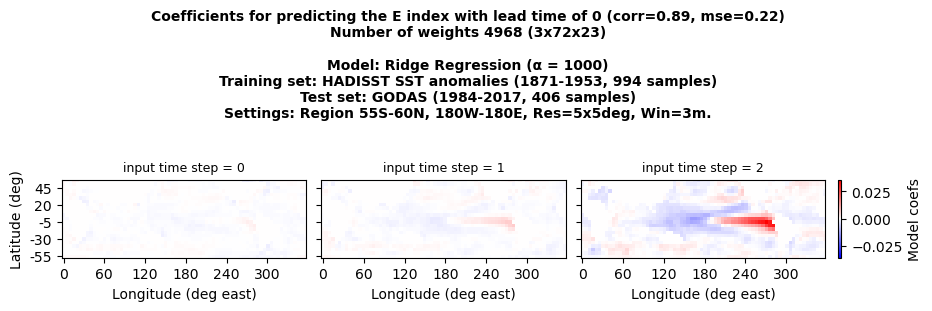


weights.shape:  (4968,)


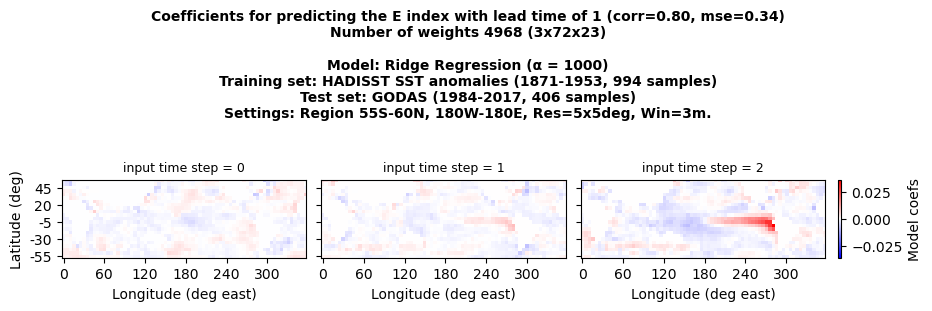


weights.shape:  (4968,)


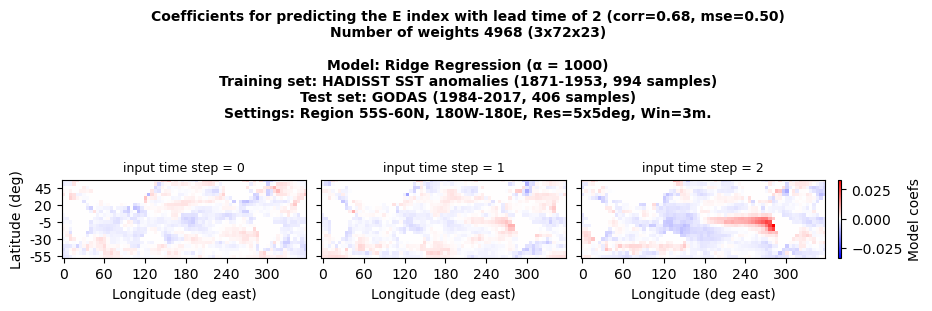


weights.shape:  (4968,)


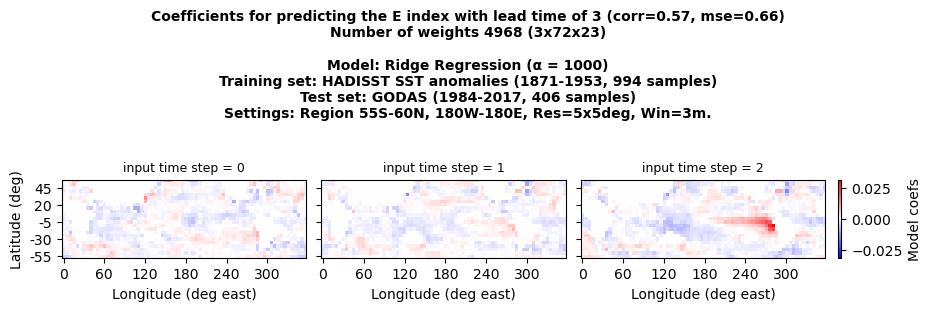


weights.shape:  (4968,)


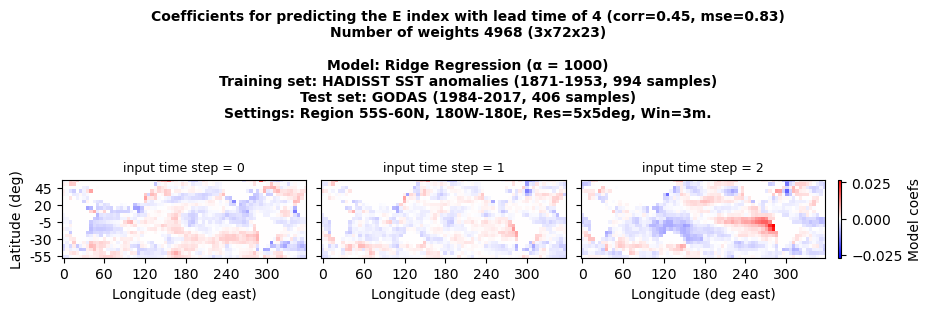


Target: C index
weights.shape:  (4968,)


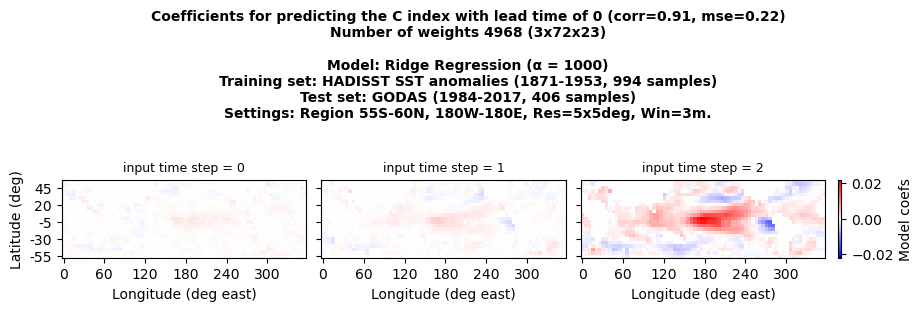


weights.shape:  (4968,)


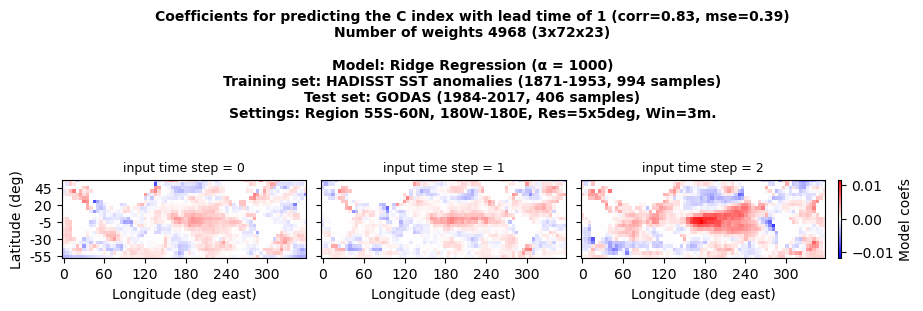


weights.shape:  (4968,)


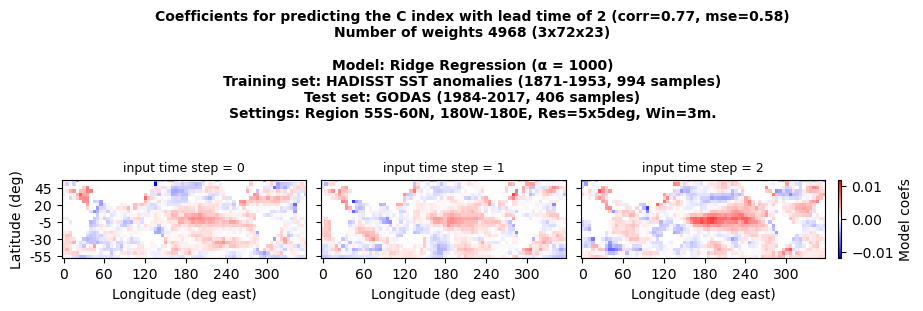


weights.shape:  (4968,)


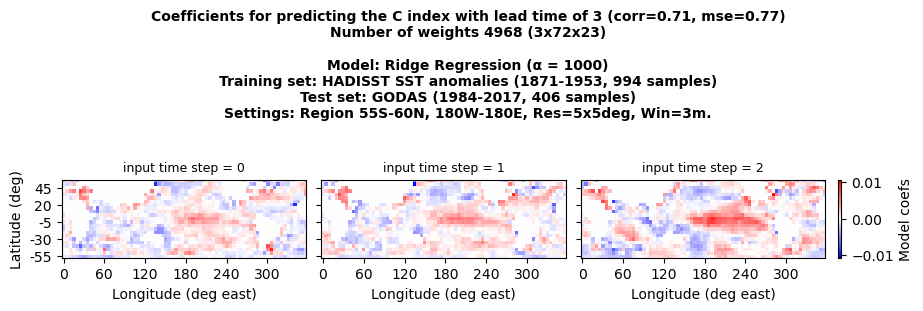


weights.shape:  (4968,)


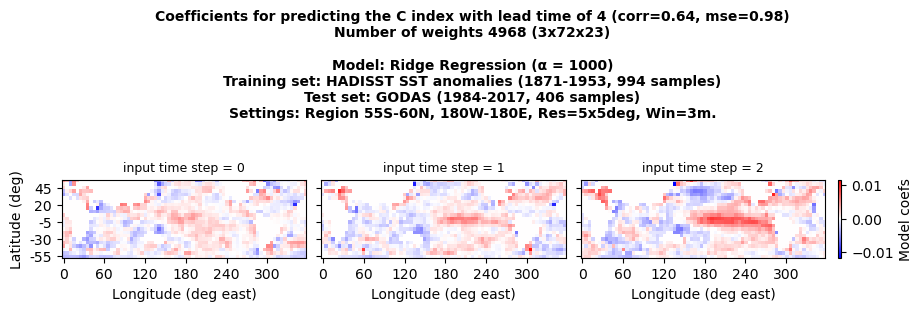

In [58]:
if USE_PCA==False:
    for target in TARGETS:
        print(f"Target: {target} index")
        for lead_time in range(0, MAX_LEAD_TIME)[:NB_LEADS_TO_DISPLAY]: 
            graph_utils.plot_weights_on_grid(rr_results, target, lead_time, INPUT_TIME_STEPS, MIN_LON, MAX_LON, MIN_LAT, MAX_LAT, RESOLUTION, nb_lon_gridpoints, nb_lat_gridpoints, rr_subtitle)
            print()
    
        print("==========================================================================================================================================================================")
        

### Persistence Forecast

#### Train Persistence Model

In [59]:
start_time_training = time.time()
start_time_training_datetime = datetime.fromtimestamp(start_time_training)
print("Start training time: ", start_time_training_datetime.strftime('%Y-%m-%d %H:%M:%S'))

Start training time:  2024-08-16 00:37:23


In [60]:
pf_data_dict = {}

for target in TARGETS:
    print(f"======================================================================================================")
    print(f"Target = {target}")
    _, y_test = graph_utils.assemble_graph_predictors_predictands(TEST_SOURCE_ID, RESOLUTION, target, test_start_date, test_end_date, 
                                                                         lead_time=0, num_input_time_steps=INPUT_TIME_STEPS, lat_slice=LAT_SLICE, lon_slice=LON_SLICE,  
                                                                         data_format="flatten", use_pca=USE_PCA, pca_components=PCA_COMPONENTS, fill_nan=True, remove_win=True, verbose=verbose)

    
    # convert time series to dataframe
    df = y_test.to_frame()
    
    for lead_time in range(1, MAX_LEAD_TIME, 1): 
        col = "t"+str(lead_time)
        df[col] = df[target].shift(lead_time)
    
    with pd.option_context('display.precision', 2):
        display(df.head())
    
    # drop rows containing missing values
    print("drop rows containing missing values")
    df = df.dropna(axis=0)

    with pd.option_context('display.precision', 2):
        display(df.head())
    
    
    pf_data_dict[target] = df
    

Target = E

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 00 month(s) lead time and 2 months offset: from 1984-03-01 to 2017-12-31
• The dimensions are: (406,): 406 months, 1 target value per month



,E,t1,t2,t3,t4,t5,t6,t7,t8,t9,...,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24
1984-03-01,0.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-04-01,0.43,0.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-05-01,-0.18,0.43,0.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-06-01,-0.71,-0.18,0.43,0.24,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-07-01,-0.80,-0.71,-0.18,0.43,0.24,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


drop rows containing missing values


,E,t1,t2,t3,t4,t5,t6,t7,t8,t9,...,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24
1986-03-01,-0.31,-0.26,-0.76,-0.91,-0.94,-0.77,-0.94,-1.15,-1.16,-0.81,...,-0.29,-0.37,-0.61,-0.34,-0.27,-0.80,-0.71,-0.18,0.43,0.24
1986-04-01,-0.62,-0.31,-0.26,-0.76,-0.91,-0.94,-0.77,-0.94,-1.15,-1.16,...,-0.42,-0.29,-0.37,-0.61,-0.34,-0.27,-0.80,-0.71,-0.18,0.43
1986-05-01,-0.42,-0.62,-0.31,-0.26,-0.76,-0.91,-0.94,-0.77,-0.94,-1.15,...,-0.62,-0.42,-0.29,-0.37,-0.61,-0.34,-0.27,-0.80,-0.71,-0.18
1986-06-01,-0.52,-0.42,-0.62,-0.31,-0.26,-0.76,-0.91,-0.94,-0.77,-0.94,...,-0.21,-0.62,-0.42,-0.29,-0.37,-0.61,-0.34,-0.27,-0.80,-0.71
1986-07-01,0.12,-0.52,-0.42,-0.62,-0.31,-0.26,-0.76,-0.91,-0.94,-0.77,...,-0.60,-0.21,-0.62,-0.42,-0.29,-0.37,-0.61,-0.34,-0.27,-0.80


Target = C

Predictors:
• Search for `GODAS` SST file in datasets/GODAS/GODAS_regridded/anom_1m_5x5deg
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.regridded_tos_anom_1m_5x5deg.nc (1980-01-01 to 2024-06-01)
• Slice the time period from 1984-01-01 to 2017-12-31
• Nb of original samples (nb months): 408
• Nb of output samples, each containing 3 time steps: 406
• Reshape sst anomalies into a 2D (406, 4968) array: 406 months x 4,968 num_input_time_steps*lon*lat values per month
• Replace 470,148 nan values (continents) out of 2,017,008 with 0's (23.31%)
• The dimensions are: (406, 4968): 406 months, 4,968 num_input_time_steps*lon*lat values per month

Predictands:
• Search for `GODAS` target file in datasets/GODAS/GODAS_regridded/ec_indices
• Load ASSIM.NOAA.GODAS.pottmp.5m.C.pca_ec_indices.txt (1980-01-01 to 2024-01-01)
• Slice the time period with 00 month(s) lead time and 2 months offset: from 1984-03-01 to 2017-12-31
• The dimensions are: (406,): 406 months, 1 target value per month



,C,t1,t2,t3,t4,t5,t6,t7,t8,t9,...,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24
1984-03-01,-0.84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-04-01,-0.98,-0.84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-05-01,-0.88,-0.98,-0.84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-06-01,-0.83,-0.88,-0.98,-0.84,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-07-01,-0.30,-0.83,-0.88,-0.98,-0.84,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


drop rows containing missing values


,C,t1,t2,t3,t4,t5,t6,t7,t8,t9,...,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24
1986-03-01,-0.32,-0.23,0.04,0.27,0.28,-0.12,-0.03,-0.02,-0.09,-0.35,...,-1.03,-0.77,-0.54,-0.46,-0.59,-0.30,-0.83,-0.88,-0.98,-0.84
1986-04-01,-0.26,-0.32,-0.23,0.04,0.27,0.28,-0.12,-0.03,-0.02,-0.09,...,-1.02,-1.03,-0.77,-0.54,-0.46,-0.59,-0.30,-0.83,-0.88,-0.98
1986-05-01,-0.02,-0.26,-0.32,-0.23,0.04,0.27,0.28,-0.12,-0.03,-0.02,...,-1.16,-1.02,-1.03,-0.77,-0.54,-0.46,-0.59,-0.30,-0.83,-0.88
1986-06-01,0.21,-0.02,-0.26,-0.32,-0.23,0.04,0.27,0.28,-0.12,-0.03,...,-1.29,-1.16,-1.02,-1.03,-0.77,-0.54,-0.46,-0.59,-0.30,-0.83
1986-07-01,0.09,0.21,-0.02,-0.26,-0.32,-0.23,0.04,0.27,0.28,-0.12,...,-0.74,-1.29,-1.16,-1.02,-1.03,-0.77,-0.54,-0.46,-0.59,-0.30


In [61]:
valid_start_year = df.index[0].date().year
valid_end_year = df.index[-1].date().year

print(f"Valid Test start and end years after dropping NaNs: {valid_start_year}-{valid_end_year}")

Valid Test start and end years after dropping NaNs: 1986-2017


In [62]:
pf_results = {}
for target in TARGETS:
    print(f"======================================================================================================")
    print(f"Target = {target}")
    y_test = pf_data_dict[target][target]

    pf_results[target] = []
    # Iterate over the different timestep predictions and their respective axes
    for lead_time, col in enumerate(pf_data_dict[target].columns):
        print(f"------------------------------------------------------------------------------------------------------")
        print(f"Lead Time: {lead_time}")
    
        pf_experiment_name = (
            f"PF_"    
            f"Train_{TRAIN_SOURCE_IDS_FILENAME}_"
            f"{train_start_year}-{train_end_year}_"
            f"Test_{TEST_SOURCE_ID_FILENAME}_"
            f"{test_start_year}-{test_end_year}_"
            f"Win{INPUT_TIME_STEPS:02d}_"
            f"{utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}_"
            f"Res{RESOLUTION}_"
            f"{target.capitalize()}Idx_"
            f"Lead{lead_time:02d}"
        )

        predictions = pf_data_dict[target][col]
        
        # Evaluate the model on the validation data
        corr, _ = scipy.stats.pearsonr(predictions, y_test)
        mse = mean_squared_error(y_test, predictions)
        
        # Store model performance metrics and coefficients in a dictionary for the current lead time
        pf_dict = { 
            'model_name': 'Persistence Forecast',
            'experiment_name': pf_experiment_name,
            'train_source_ids': None,
            'test_source_id': TEST_SOURCE_ID,
            'nb_train_samples': None,
            'nb_test_samples': X_test.shape[0],
            'target': target, 
            'train_start_date': None,
            'train_end_date': None,
            'val_start_date': None,
            'val_end_date': None,
            'test_start_date': test_start_date,
            'test_end_date': test_end_date,
            'lead_time': lead_time,
            'num_input_time_steps': None,
            'y_test': y_test,
            'predictions': predictions,
            'corr': corr, 
            'mse': mse,
        }
        pf_results[target].append(pf_dict)
    
        print(f'Predicted and True {target} Indices at {lead_time} Months Lead Time: Corr: {corr:.3f}, MSE: {mse:.3f}')


Target = E
------------------------------------------------------------------------------------------------------
Lead Time: 0
Predicted and True E Indices at 0 Months Lead Time: Corr: 1.000, MSE: 0.000
------------------------------------------------------------------------------------------------------
Lead Time: 1
Predicted and True E Indices at 1 Months Lead Time: Corr: 0.911, MSE: 0.169
------------------------------------------------------------------------------------------------------
Lead Time: 2
Predicted and True E Indices at 2 Months Lead Time: Corr: 0.781, MSE: 0.415
------------------------------------------------------------------------------------------------------
Lead Time: 3
Predicted and True E Indices at 3 Months Lead Time: Corr: 0.655, MSE: 0.652
------------------------------------------------------------------------------------------------------
Lead Time: 4
Predicted and True E Indices at 4 Months Lead Time: Corr: 0.535, MSE: 0.879
-----------------------------

In [63]:
elapsed_time_training_seconds = time.time() - start_time_training
hours_train, remainder_train = divmod(elapsed_time_training_seconds, 3600)
minutes_train, seconds_train = divmod(remainder_train, 60)
hhmmss_elapsed_train_time = f'{int(hours_train):02}:{int(minutes_train):02}:{int(seconds_train):02}'
print(f"\nElapsed time to train the RR: {hhmmss_elapsed_train_time}")  
print(f"• Targets: {TARGETS}")
# print(f"• Lead Times: {START_LEAD_TIME} to {MAX_LEAD_TIME}")
print(f"• Max Lead Time: {MAX_LEAD_TIME}")
print(f"• Window size: {INPUT_TIME_STEPS}")


Elapsed time to train the RR: 00:00:00
• Targets: ['E', 'C']
• Max Lead Time: 25
• Window size: 3


#### Write PF results to txt file

In [64]:
for target in TARGETS:
    print(f"\n\n===========================================================================================")
    print(f"Target:         {target}")

    results_folder = target_to_results_folder.get(target)
    if results_folder is None:
        print(f"Unknown target {target}. Abort")
    save_results_folder = os.path.join(results_folder, "pf")
    os.makedirs(save_results_folder, exist_ok=True) 
    print(save_results_folder)

    pf_dict_save = pf_results[target]
    
    # Access the last entry in the dictionary
    train_experiment_data = pf_results[target][-1]
    # print(train_experiment_data)
    
    # Open the file and write the results
    file_exp_name = train_experiment_data['experiment_name']
    
    filepath = f'{save_results_folder}/results_sum_{file_exp_name}.txt'
    print(f"Save results as text file to {filepath}")
    with open(f'{filepath}', 'w') as f:
        f.write(f"Experiment Name: {train_experiment_data['experiment_name']}\n")
        f.write(f"Model Name: {train_experiment_data['model_name']}\n")
        f.write(f"Train Source IDs: {train_experiment_data['train_source_ids']}\n")
        f.write(f"Test Source ID: {train_experiment_data['test_source_id']}\n")
        # f.write(f"Number of Training Samples: {train_experiment_data['nb_train_samples']}\n")
        # f.write(f"Number of Test Samples: {train_experiment_data['nb_test_samples']}\n")
        f.write(f"Target: {train_experiment_data['target']}\n")
        f.write(f"Training Start Date: {train_experiment_data['train_start_date']}\n")
        f.write(f"Training End Date: {train_experiment_data['train_end_date']}\n")
        f.write(f"Validation Start Date: {train_experiment_data['val_start_date']}\n")
        f.write(f"Validation End Date: {train_experiment_data['val_end_date']}\n")
        f.write(f"Test Start Date: {train_experiment_data['test_start_date']}\n")
        f.write(f"Test End Date: {train_experiment_data['test_end_date']}\n")
        f.write(f"Resolution: {RESOLUTION}\n")
        f.write(f"Region: {utils.add_cardinals_title(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}\n")
        f.write(f"Number of Input Time Steps: {train_experiment_data['num_input_time_steps']}\n")
        f.write("\n")
        # f.write(f"GPU: {torch.cuda.get_device_name(0)}\n")
        f.write(f"Targets: {TARGETS}\n")
        f.write(f"Max Lead Time: {MAX_LEAD_TIME}\n")
        f.write(f"Window size: {INPUT_TIME_STEPS}\n")


        f.write(f"\n\n\n\n------------------------------------------------------------------------\n")
        f.write(f"Training:\n")
        f.write(f"\nElapsed time to train the pf for all leads: {hhmmss_elapsed_train_time}\n")  
            
        for lead_time in range(0, MAX_LEAD_TIME, 1):
            # print(lead_time)
            pf_dict_lead = pf_dict_save[lead_time]
            f.write(f"• Lead time: {lead_time:>2},   Corr: {pf_dict_lead['corr']:.4f},   MSE: {pf_dict_lead['mse']:.4f}\n")



Target:         E
saved_results/ec/pf
Save results as text file to saved_results/ec/pf/results_sum_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx_Lead24.txt


Target:         C
saved_results/ec/pf
Save results as text file to saved_results/ec/pf/results_sum_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx_Lead24.txt


#### Plot Persistence Forecasts accross different lead times

In [65]:
for target in TARGETS:
    nb_test_samples = pf_results[target][0]['nb_test_samples']
    pf_subtitle = (
        f'Model: Persistent Forecast\n'
        f'Training set: None\n' 
        f'Test set: {TEST_SOURCE_ID} ({test_start_year}-{test_end_year}, {nb_test_samples} samples)\n'
        f'Settings: Region {COORDINATES}, Res={RESOLUTION}x{RESOLUTION}deg\n\n'
    )
    print(pf_subtitle)

Model: Persistent Forecast
Training set: None
Test set: GODAS (1984-2017, 406 samples)
Settings: Region 55S-60N, 180W-180E, Res=5x5deg


Model: Persistent Forecast
Training set: None
Test set: GODAS (1984-2017, 406 samples)
Settings: Region 55S-60N, 180W-180E, Res=5x5deg




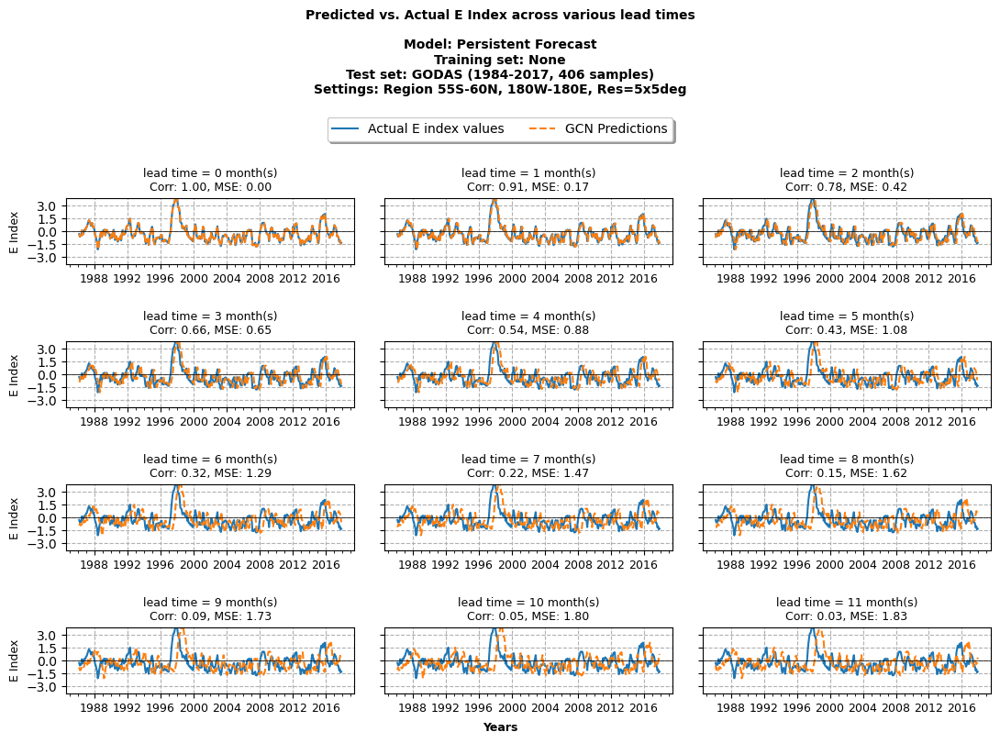

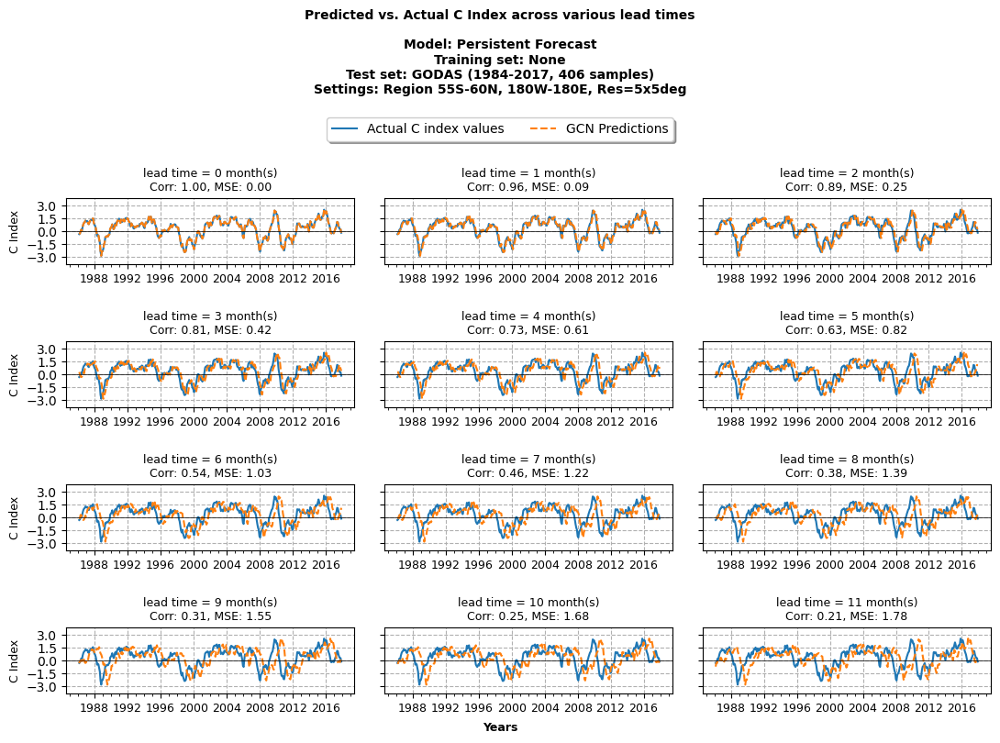

In [66]:
for target in TARGETS:
    graph_utils.plot_pred_vs_actual_timeseries(pf_results, target, abs_v_max, rows_to_show=4, 
                                               subtitle=pf_subtitle, save_img=False, img_filename=None, img_folder=None)

In [67]:
# for target in TARGETS:
#     fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(12, 6), sharex=True, sharey=True)
    
#     # Iterate over the ridge regression models' results and their respective axes
#     for pf_dict, ax in zip(pf_results[target], axs.flat):
    
#         # Align timestamps of predictions and actual values
#         predictions = pd.Series(pf_dict['predictions'], index=pf_dict['y_test'].index)
#         predictions = predictions.sort_index()
#         y_test = pf_dict['y_test'].sort_index()
    
#         # Plot machine learning predictions and actual values on the same plot
#         ax.plot(y_test, label=f'Groud Truth ({source_id})')
#         ax.plot(predictions, '--', label='PF Predictions')
        
#         ax.set_title(f"lead time = {pf_dict['lead_time']} months\nCorr: {pf_dict['corr']:.2f}, MSE: {pf_dict['mse']:.2f}", fontsize=9)
#         ax.xaxis.set_major_locator(mdates.YearLocator(base=4))  # base=2 for every other year    
#         ax.tick_params(axis='x', which='both', labelbottom=True) # Ensure the x-axis labels are visible for each subplot
#         ax.grid(linestyle='dashed')
#         handles, labels = ax.get_legend_handles_labels()
        
#     fig.legend(handles, labels, loc='upper right')
#     # fig.suptitle(f'Predicted and True {target} Indices accross various lead times\nRidge regressor (α = {alpha}) trained on {source_id} data ({utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)})from {test_start_year} to {test_end_year}', fontweight="bold")
#     fig.suptitle(f'Predicted and True {target} Indices Across Various Lead Times\n(Persistence forecasts on {source_id} data)', fontweight="bold", fontsize=10)
    
#     fig.text(0.5, 0.0, 'Years', ha='center', va='center', fontsize=9, fontweight="bold")
#     fig.text(0.00, 0.5,  f'{target} index', ha='center', va='center', rotation='vertical', fontsize=9, fontweight="bold")
#     plt.tight_layout( h_pad=2, w_pad=None, rect=None)
#     plt.show()

In [68]:
# for target in TARGETS:
#     fig, axs = plt.subplots(nrows=int(MAX_LEAD_TIME/3), ncols=3, figsize=(12, 8), sharex=True, sharey=True)
    
#     y_test = df[target]
    
#     # Iterate over the different timestep predictions and their respective axes
#     for lead_time, (col, ax) in enumerate(zip(df.columns, axs.flat)):
    
#         predictions = df[col]
        
#         # Evaluate the model on the validation data
#         corr, _ = scipy.stats.pearsonr(predictions, y_test)
#         mse = mean_squared_error(y_test, predictions)
        
#         # Store model performance metrics and coefficients in a dictionary for the current lead time
#         pf_dict = { 
#         	'lead_time': lead_time,
#         	'y_test': y_test,
#         	'predictions': predictions,
#         	'corr': corr, 
#         	'mse': mse,
#         }
#         # pf_results.append(pf_dict)
    
#         print(f'Predicted and True {target} Indices at {lead_time} Months Lead Time: Corr: {corr:.3f}, MSE: {mse:.3f}')
    
        
#         # Plot Naive predictions and actual values on the same plot
#         ax.plot(y_test, label=f'Actual Data')
#         ax.plot(predictions, label="Persistence Forecast", linestyle='--')
    
#         ax.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
#         ax.xaxis.set_major_locator(mdates.YearLocator(base=2))  # base=2 for every other year    
#         ax.xaxis.set_minor_locator(mdates.YearLocator(1))
    
#         ax.set_title(f"lead time = {lead_time} month(s)\nCorr: {corr:.2f}, mse: {mse:.2f}", fontsize=9)
#         ax.tick_params(axis='x', which='both', labelbottom=True) # ensure the x-axis labels are visible for each subplot
    
#         # ax.grid(linestyle='dashed')
#         ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    
#         # Set the y-label for the leftmost subplot in each row
#         if lead_time % 3 == 0:
#             ax.set_ylabel('Niño 3.4 index [°C]', fontsize=9)
            
#         handles, labels = ax.get_legend_handles_labels()
        
#     fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.968), ncol=2, shadow=True)
    
#     fig.suptitle(f'Persistence Forecasts vs. Niño 3.4 Indices Across Various Lead Times\n({source_id} data between {val_start_year} and {val_end_year})', fontweight="bold", fontsize=10)
#     fig.text(0.5, 0.0, 'Date', ha='center', va='center', fontsize=9, fontweight="bold")
#     # fig.text(0.00, 0.5,  'Niño 3.4 index (°C)', ha='center', va='center', rotation='vertical', fontsize=9, fontweight="bold")
#     fig.tight_layout(h_pad=2, w_pad=None, rect=[0, 0, 1, 0.97]) # (left, bottom, right, top), default: (0, 0, 1, 1)
    
    
#     # if SAVE_PLOTS_TO_DISK == True:
#     #     filename = "plot_nino34_persistence_timeseries_"+source_id+"_"+val_start_year+"-"+val_end_year+".jpg"
#     #     fig.savefig(IMG_FOLDER+filename, dpi=300, bbox_inches='tight')
#     #     print(f"Saved {filename} to disk")
        
#     plt.show()

## Compare ML predictions with baseline Persistence forecast

In [69]:
general_subtitle = (
    f'Training set: {TRAIN_SOURCE_IDS_STR} SST anomalies ({train_start_year}-{train_end_year}, {nb_train_samples} samples)\n' 
    f'Test set: {TEST_SOURCE_ID} ({test_start_year}-{test_end_year}, {nb_test_samples} samples)\n'
    f'Settings: Region {COORDINATES}, Res={RESOLUTION}x{RESOLUTION}deg, Win={INPUT_TIME_STEPS}months'
)

print(general_subtitle)

Training set: HADISST SST anomalies (1871-1953, 994 samples)
Test set: GODAS (1984-2017, 406 samples)
Settings: Region 55S-60N, 180W-180E, Res=5x5deg, Win=3months


In [70]:
TEST_SOURCE_ID

'GODAS'

#### Plot All models forecasts versus actual time-series

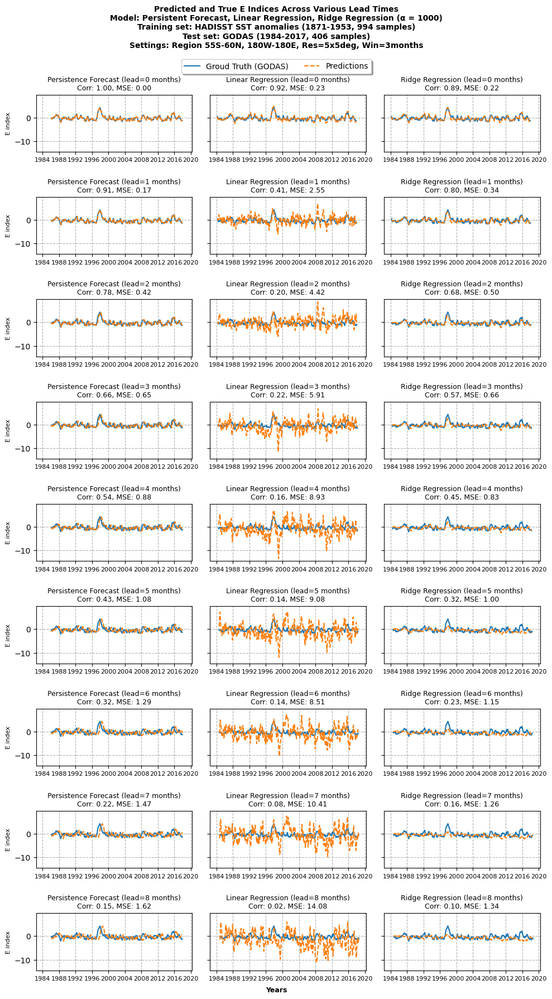

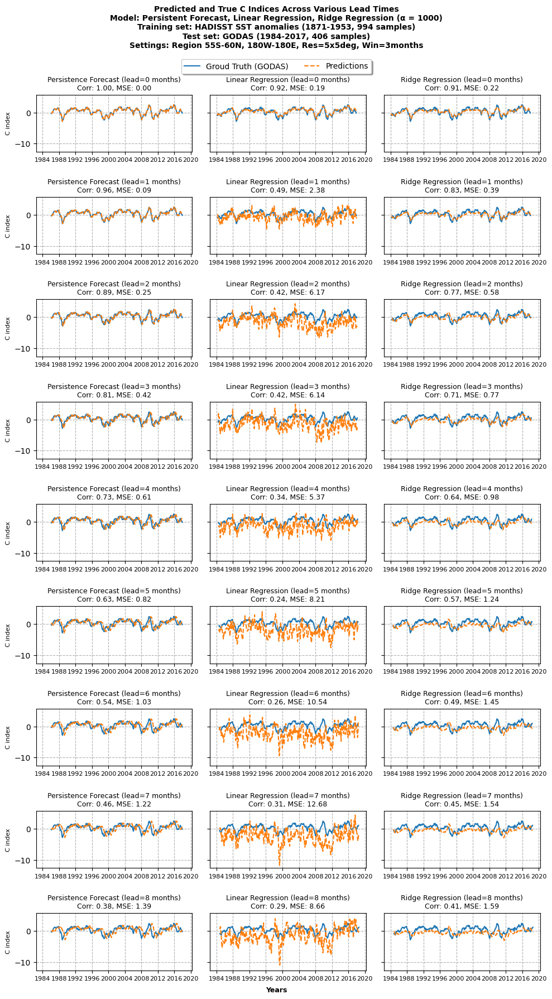

In [71]:
for target in TARGETS:
    nrows = min(len(lr_results[target]), 9)
    fig, axs = plt.subplots(nrows=nrows, ncols=3, figsize=(10, nrows*2), sharex=True, sharey=True)
    
    for (pf_dict, lr_dict, rr_dict), (ax1, ax2, ax3) in zip(zip(pf_results[target], lr_results[target], rr_results[target]), axs):
    
        
        ######## PERSISTENCE FORECASTS ########
        
        # Align timestamps of predictions and actual values
        pf_predictions = pd.Series(pf_dict['predictions'], index=pf_dict['y_test'].index)
        pf_predictions = pf_predictions.sort_index()
        y_test = pf_dict['y_test'].sort_index()
    
        # Plot machine learning predictions and actual values on the same plot
        ax1.plot(y_test, label=f'Groud Truth ({TEST_SOURCE_ID})')
        ax1.plot(pf_predictions, '--', label='PF Predictions')
        
        ax1.set_title(f"Persistence Forecast (lead={pf_dict['lead_time']} months)\nCorr: {pf_dict['corr']:.2f}, MSE: {pf_dict['mse']:.2f}", fontsize=9)
        ax1.xaxis.set_major_locator(mdates.YearLocator(base=4))  # base=4 for every four year    
        ax1.tick_params(axis='x', which='both', labelbottom=True, labelsize=8) # ensure the x-axis labels are visible for each subplot
        ax1.grid(linestyle='dashed')
        ax1.set_ylabel(f'{target} index', fontsize=8) # Set the y-label for the leftmost subplot in each row
        handles, labels = ax1.get_legend_handles_labels()
    
        
        ######## LINEAR REGRESSION ########
        
        # Align timestamps of predictions and actual values
        lr_predictions = pd.Series(lr_dict['predictions'], index=lr_dict['y_test'].index)
        lr_predictions = lr_predictions.sort_index()
        y_test = lr_dict['y_test'].sort_index()
    
        # Plot machine learning predictions and actual values on the same plot
        ax2.plot(y_test, label=f'Groud Truth ({TEST_SOURCE_ID})')
        ax2.plot(lr_predictions, '--', label='LR Predictions')
        
        ax2.set_title(f"Linear Regression (lead={lr_dict['lead_time']} months)\nCorr: {lr_dict['corr']:.2f}, MSE: {lr_dict['mse']:.2f}", fontsize=9)
        ax2.xaxis.set_major_locator(mdates.YearLocator(base=4))  # base=4 for every four year    
        ax2.tick_params(axis='x', which='both', labelbottom=True, labelsize=8) # ensure the x-axis labels are visible for each subplot
        ax2.grid(linestyle='dashed')
        handles, labels = ax2.get_legend_handles_labels()
    
        
        ######## RIDGE REGRESSION ########
        
        # Align timestamps of predictions and actual values
        rr_predictions = pd.Series(rr_dict['predictions'], index=rr_dict['y_test'].index)
        rr_predictions = rr_predictions.sort_index()
        y_test = rr_dict['y_test'].sort_index()
    
        # Plot machine learning predictions and actual values on the same plot
        ax3.plot(y_test, label=f'Groud Truth ({TEST_SOURCE_ID})')
        ax3.plot(rr_predictions, '--', label='RR Predictions')
        
        ax3.set_title(f"Ridge Regression (lead={rr_dict['lead_time']} months)\nCorr: {rr_dict['corr']:.2f}, MSE: {rr_dict['mse']:.2f}", fontsize=9)
        ax3.xaxis.set_major_locator(mdates.YearLocator(base=4))  # base=4 for every four year    
        ax3.tick_params(axis='x', which='both', labelbottom=True, labelsize=8) # ensure the x-axis labels are visible for each subplot
        ax3.grid(linestyle='dashed')
        handles, labels = ax3.get_legend_handles_labels()
    
    fig.legend(handles, [labels[0], 'Predictions'], loc='upper center', bbox_to_anchor=(0.5, 0.93), ncol=2, shadow=True)
    fig.suptitle(
        f'Predicted and True {target} Indices Across Various Lead Times\n'
        f'Model: Persistent Forecast, Linear Regression, Ridge Regression (α = {alpha})\n'
        f'{general_subtitle}', fontsize=10, fontweight="bold")
        
        # (LR and RR Models trained on {TEST_SOURCE_ID} data ({utils.add_cardinals_fname(MIN_LAT, MAX_LAT, MIN_LON, MAX_LON)}) from {train_start_year} to {train_end_year}
        

    fig.text(0.5, 0.0, 'Years', ha='center', va='center', fontsize=9, fontweight="bold")
    # fig.text(0.00, 0.5,  f'{target} index', ha='center', va='center', rotation='vertical', fontsize=9, fontweight="bold")
    fig.tight_layout(h_pad=2, w_pad=None, rect=[0, 0, 1, 0.97]) # (left, bottom, right, top), default: (0, 0, 1, 1)
    plt.show()

#### Plot Corr and MSE of all models

In [72]:
pf_correlations, lr_correlations, rr_correlations, cnn_correlations, gnn_correlations = {}, {}, {}, {}, {}
pf_mses, lr_mses, rr_mses, cnn_mses, gnn_mses = {}, {}, {}, {}, {}

for target in TARGETS:

    pf_correlations[target] = [pf_dict['corr'] for pf_dict in pf_results[target]]
    lr_correlations[target] = [lr_dict['corr'] for lr_dict in lr_results[target]]
    rr_correlations[target] = [rr_dict['corr'] for rr_dict in rr_results[target]]
    # cnn_correlations[target] = [cnn_dict['corr'] for cnn_dict in cnn_results[target]]
    # gnn_correlations[target] = [gnn_dict['corr'] for gnn_dict in gnn_results[target]]

    pf_mses[target] = [pf_dict['mse'] for pf_dict in pf_results[target]]
    lr_mses[target] = [lr_dict['mse'] for lr_dict in lr_results[target]]
    rr_mses[target] = [rr_dict['mse'] for rr_dict in rr_results[target]]
    # cnn_mses[target] = [cnn_dict['mse'] for cnn_dict in cnn_results[target]]
    # gnn_mses[target] = [gnn_dict['mse'] for gnn_dict in gnn_results[target]]

Target: E index
weights.shape:  (4968,)


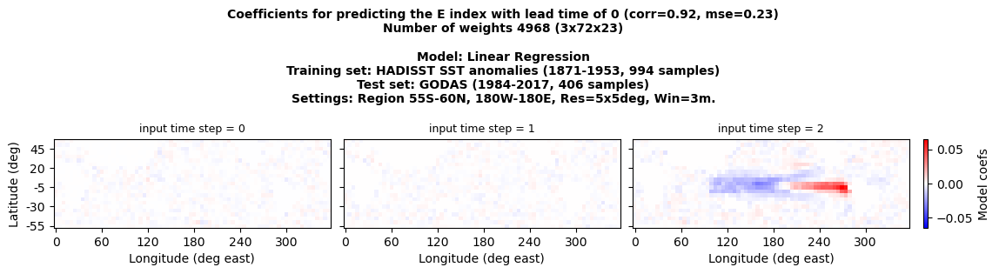


weights.shape:  (4968,)


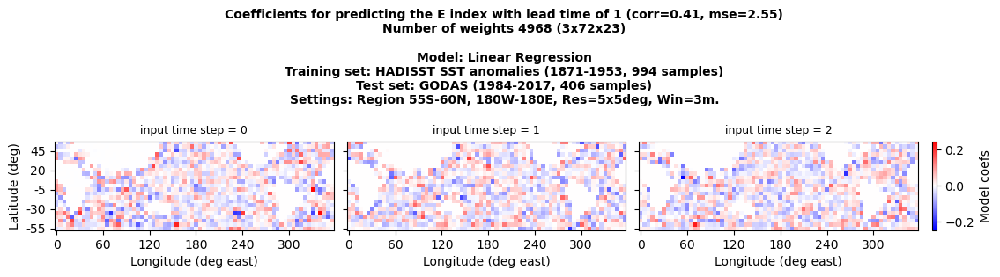


weights.shape:  (4968,)


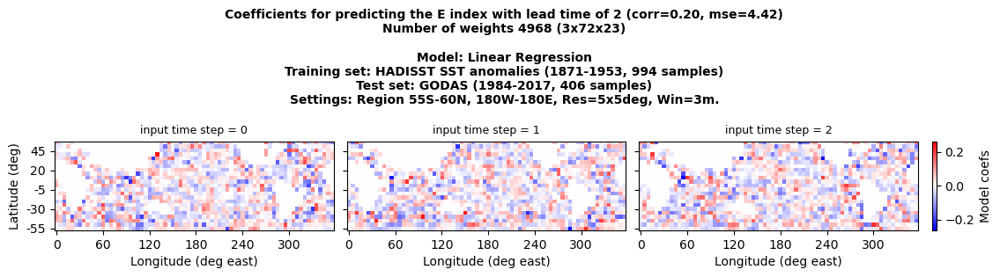


Target: C index
weights.shape:  (4968,)


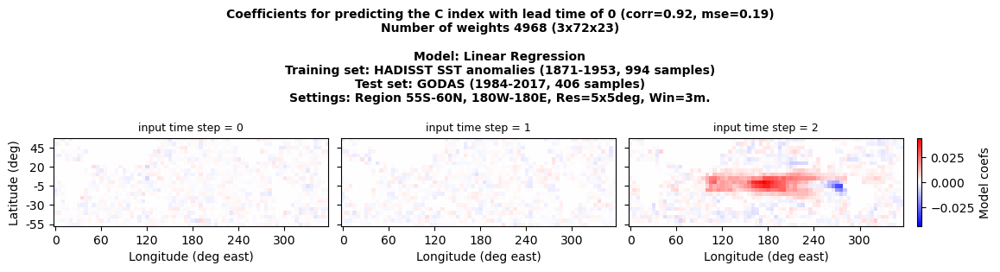


weights.shape:  (4968,)


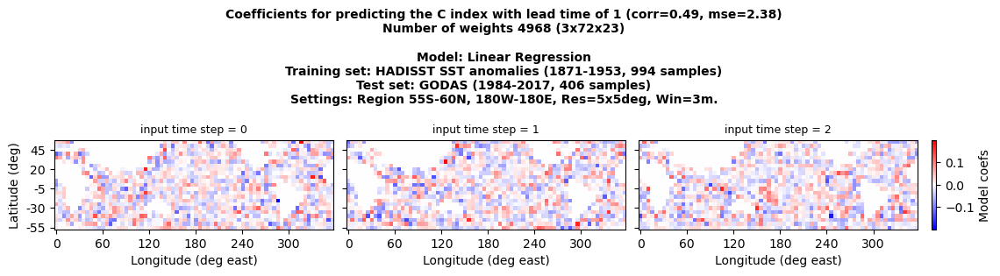


weights.shape:  (4968,)


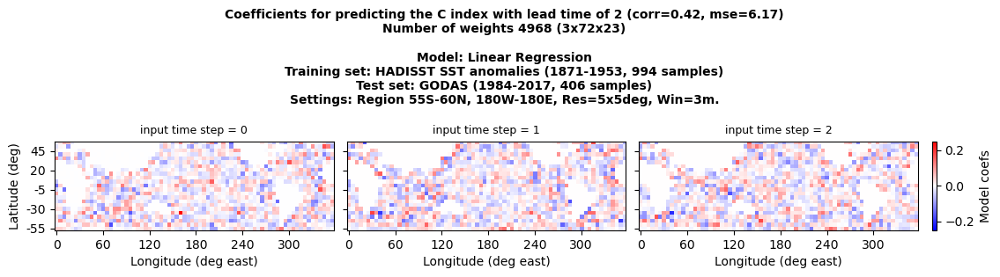

In [73]:
if USE_PCA==False:
    for target in TARGETS:
        print(f"Target: {target} index")
        for lead_time in range(0, MAX_LEAD_TIME)[:3]: 
            graph_utils.plot_weights_on_grid(lr_results, target, lead_time, INPUT_TIME_STEPS, MIN_LON, MAX_LON, MIN_LAT, MAX_LAT, RESOLUTION, nb_lon_gridpoints, nb_lat_gridpoints, lr_subtitle)
            print()
    
        print("==========================================================================================================================================================================")

In [74]:
for color in plt.rcParams["axes.prop_cycle"].by_key()["color"]:
    print(color)

#1f77b4
#ff7f0e
#2ca02c
#d62728
#9467bd
#8c564b
#e377c2
#7f7f7f
#bcbd22
#17becf


In [75]:
correlation_dicts={
    'Persistence Forecast': pf_correlations,
    'Linear Regression': lr_correlations,
    'Ridge Regression': rr_correlations
}
mse_dicts={
    'Persistence Forecast': pf_mses,
    'Linear Regression': lr_mses,
    'Ridge Regression': rr_mses
}

# color_list = ['blue', 'orange', 'green', 'red', 'purple']
# color_list = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'] # matplolib standard colors
color_list = ['#1f77b4', '#2ca02c', '#d62728', '#9467bd'] # matplolib standard colors
linestyle_list=['-', '--', '-', '-', '-']

In [76]:
general_subtitle

'Training set: HADISST SST anomalies (1871-1953, 994 samples)\nTest set: GODAS (1984-2017, 406 samples)\nSettings: Region 55S-60N, 180W-180E, Res=5x5deg, Win=3months'

Target: E index


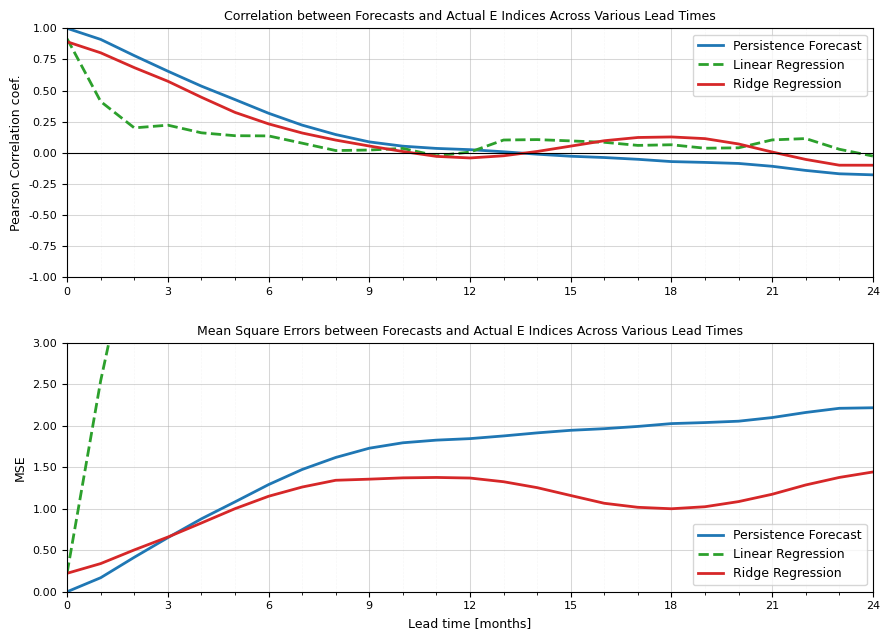

Saved _model_corr_mse_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx_Lead24_no_title.jpg to disk


Target: C index


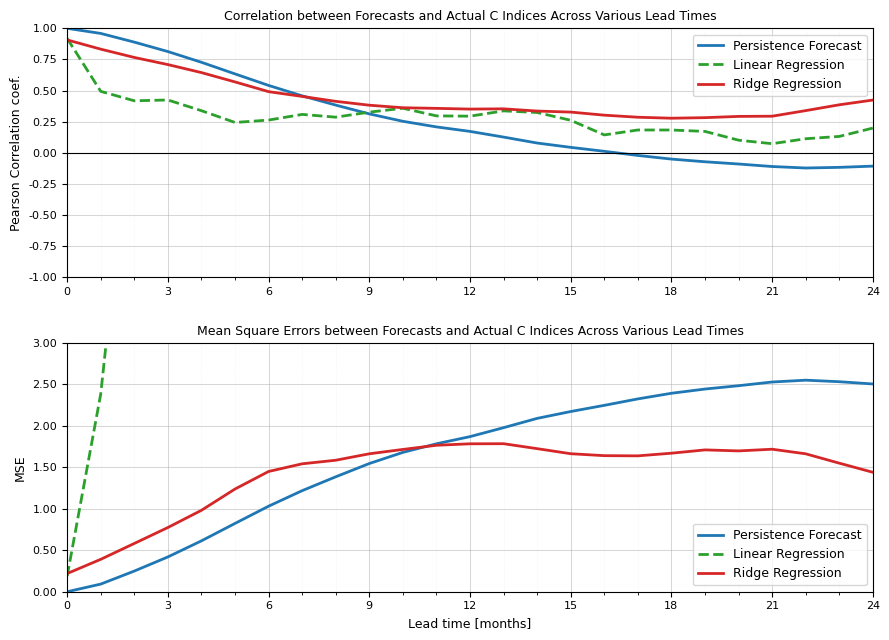

Saved _model_corr_mse_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx_Lead24_no_title.jpg to disk




In [77]:
for target in TARGETS:
    print(f"Target: {target} index")
    # filename = f"_model_corr_mse_{rr_results[target][-1]['experiment_name'].split("_", 1)[1]}.jpg"
    filename = f"_model_corr_mse_{rr_results[target][-1]['experiment_name'].split("_", 1)[1]}_no_title.jpg"
    graph_utils.plot_corr_mse(correlation_dicts, mse_dicts, target, MAX_LEAD_TIME, 
                              mse_y_lim_max=3, alpha_list=None, color_list=color_list, linestyle_list=linestyle_list, 
                              suptitle=None, save_img=SAVE_PLOTS_TO_DISK, img_filename=filename, img_folder=IMG_FOLDER)
    print("\n" + "=" * 200 + "\n")

### Save results to disk

In [78]:
lr_filename = "results_" + lr_experiment_name.split("_Lead")[0] + ".pkl"
rr_filename = "results_" + rr_experiment_name.split("_Lead")[0] + ".pkl"
pf_filename = "results_" + pf_experiment_name.split("_Lead")[0] + ".pkl"
print(lr_filename)
print(rr_filename)
print(pf_filename)


results_LR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx.pkl
results_RR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx.pkl
results_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx.pkl


In [79]:
lr_results[target][0]['experiment_name']

'LR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx_Lead00'

In [80]:
for target in TARGETS:
    print(f"===================================================================================")
    print(f"Target: {target}")

    results_folder = target_to_results_folder.get(target)
    
    temp_lead = 0
    lr_filename = "results_" + lr_results[target][temp_lead]['experiment_name'].split("_Lead")[0] + ".pkl"
    rr_filename = "results_" + rr_results[target][temp_lead]['experiment_name'].split("_Lead")[0] + ".pkl"
    pf_filename = "results_" + pf_results[target][temp_lead]['experiment_name'].split("_Lead")[0] + ".pkl"


    # Save Linear Regression results as pickle file
    save_results_folder = os.path.join(results_folder, "lr")
    os.makedirs(save_results_folder, exist_ok=True) 
    filepath = os.path.join(save_results_folder, lr_filename)
    with open(filepath, "wb") as file:
        pickle.dump(lr_results[target], file)
        print(f"Saved Linear Regression model results to {filepath}")
    
    
    
    # Save Ridge Regression results as pickle file
    save_results_folder = os.path.join(results_folder, "rr")
    os.makedirs(save_results_folder, exist_ok=True) 
    filepath = os.path.join(save_results_folder, rr_filename)
    with open(filepath, "wb") as file:
        pickle.dump(rr_results[target], file)
        print(f"Saved Ridge Regression model results to {filepath}")
    
    
    # Save persistent forecast results as pickle file
    save_results_folder = os.path.join(results_folder, "pf")
    os.makedirs(save_results_folder, exist_ok=True) 
    filepath = os.path.join(save_results_folder, pf_filename)
    with open(filepath, "wb") as file:
        pickle.dump(pf_results[target], file)
        print(f"Saved Persistent Forecast model results to {filepath}")

Target: E
Saved Linear Regression model results to saved_results/ec/lr/results_LR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
Saved Ridge Regression model results to saved_results/ec/rr/results_RR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
Saved Persistent Forecast model results to saved_results/ec/pf/results_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_EIdx.pkl
Target: C
Saved Linear Regression model results to saved_results/ec/lr/results_LR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx.pkl
Saved Ridge Regression model results to saved_results/ec/rr/results_RR_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx.pkl
Saved Persistent Forecast model results to saved_results/ec/pf/results_PF_Train_HADISST_1871-1953_Test_GODAS_1984-2017_Win03_55S-60N-180W-180E_Res5_CIdx.pkl
